In [ ]:
# Standard library imports
import argparse
import json
import os
import sys
from datetime import date, datetime, time as dtime
from pathlib import Path
from typing import Dict, List, Optional, Tuple
from urllib.parse import urlencode

# Data manipulation and analysis
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d import Axes3D  # Register 3D projection
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mtick

# Scientific computing
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.optimize import curve_fit
from scipy.spatial.distance import pdist, squareform

# Machine learning
from sklearn.cluster import AgglomerativeClustering
from sklearn.ensemble import HistGradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import PoissonRegressor, Ridge
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Dimensionality reduction
# Suppress OpenMP deprecation warning from umap-learn
import contextlib
import io
with contextlib.redirect_stderr(io.StringIO()):
    import umap

# HTTP requests
import requests
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry

# Environment variables
from dotenv import load_dotenv

# ---------------------------------
# Config
# ---------------------------------
PHASE_CHANGES = '../data/phase_change_data.csv'
RAW_DATA = '../data/raw_data_all_locations.csv'
DAILY_SUMS = '../data/daily_summaries_all_locations.csv'
BIRDCAST_PARQUET = '../../birdcast-data-grabber/data/birdcast_data.parquet'
BIRDCAST_CSV = '../../birdcast-data-grabber/data/birdcast_data.csv'
load_dotenv()

# Time-binning config
TIME_BIN_START_HOUR = 0     # 6 AM
TIME_BIN_END_HOUR = 23      # 8 PM (20 in 24h)
TIME_BIN_MINUTES = 30       # 30-minute bins

# Plot config
PLOTLY_RENDERER = 'browser'

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

# ---------------------------------
# Dashboard Export Functions
# ---------------------------------
# Create dashboard output directory
DASHBOARD_DIR = '../docs/dashboard_plots'
os.makedirs(DASHBOARD_DIR, exist_ok=True)
os.makedirs(f'{DASHBOARD_DIR}/images', exist_ok=True)
os.makedirs(f'{DASHBOARD_DIR}/interactive', exist_ok=True)

print(f"Dashboard plots will be saved to: {DASHBOARD_DIR}")

# Function to save matplotlib plots
def save_plot_for_dashboard(fig, filename, title, description=""):
    """Save matplotlib figure for dashboard with metadata."""
    # Save as high-res PNG
    png_path = f'{DASHBOARD_DIR}/images/{filename}.png'
    fig.savefig(png_path, dpi=300, bbox_inches='tight', facecolor='white')
    
    # Create metadata file
    metadata = {
        'title': title,
        'description': description,
        'filename': filename,
        'type': 'matplotlib',
        'created': datetime.now().isoformat(),
        'image_path': f'images/{filename}.png'
    }
    
    with open(f'{DASHBOARD_DIR}/{filename}.json', 'w') as f:
        json.dump(metadata, f, indent=2)
    
    print(f"Saved: {title} -> {filename}")
    return filename

Dashboard plots will be saved to: ../docs/dashboard_plots


In [2]:
# ---------------------------------
# Helpers for time-binning & plots
# ---------------------------------
def build_time_bins(start_hour: int = TIME_BIN_START_HOUR,
                    end_hour: int = TIME_BIN_END_HOUR,
                    step_minutes: int = TIME_BIN_MINUTES) -> Tuple[List[dtime], List[str]]:
    time_bins: List[dtime] = []
    for hour in range(start_hour, end_hour + 1):
        for minute in range(0, 60, step_minutes):
            if hour == end_hour and minute >= 60:
                break
            time_bins.append(dtime(hour, minute))
    time_labels = [t.strftime('%I:%M %p') for t in time_bins]
    return time_bins, time_labels


def assign_time_bin_factory(time_bins: List[dtime]):
    # Returns a function that maps a datetime.time -> index of its bin
    def assign_time_bin(t):
        if t is None or pd.isna(t):
            return None
        t_minutes = t.hour * 60 + t.minute
        for i, bin_time in enumerate(time_bins):
            bin_minutes = bin_time.hour * 60 + bin_time.minute
            if t_minutes < bin_minutes + TIME_BIN_MINUTES:
                return i
        return len(time_bins) - 1
    return assign_time_bin


def prepare_complete_data(raw_df: pd.DataFrame,
                          time_bins: List[dtime]) -> Tuple[pd.DataFrame, List[str], list, list, pd.DataFrame]:
    # Ensure Time column is datetime.time
    if not np.issubdtype(pd.Series(raw_df['Time']).dtype, np.dtype('O')):
        raw_df = raw_df.copy()
        raw_df['Time'] = pd.to_datetime(raw_df['Time'], format='%H:%M:%S').dt.time

    time_bins, time_labels = build_time_bins()
    assign_time_bin = assign_time_bin_factory(time_bins)

    df = raw_df.copy()
    df['TimeBin'] = pd.to_datetime(df['Time']).apply(assign_time_bin)
    df = df.dropna(subset=['TimeBin'])

    grouped_data = df.groupby(['Date', 'TimeBin']).size().reset_index(name='Count')

    all_dates = sorted(df['Date'].unique())
    all_time_bins = list(range(len(time_bins)))

    complete_grid = pd.DataFrame([(date, tb) for date in all_dates for tb in all_time_bins],
                                 columns=['Date', 'TimeBin'])

    complete_data = complete_grid.merge(grouped_data, on=['Date', 'TimeBin'], how='left').fillna(0)

    dates = sorted(complete_data['Date'].unique())
    time_bin_indices = sorted(complete_data['TimeBin'].unique())
    return complete_data, time_labels, dates, time_bin_indices, grouped_data

def plot_heatmap_counts_subplots(location_data: dict,
                                title: str = 'Heatmap: Date vs Time of Day vs Observation Count') -> None:
    locations = sorted(list(location_data.keys())) 
    n_locations = len(locations)
    
    fig, axes = plt.subplots(1, n_locations, figsize=(18*n_locations, 10))
    
    # Ensure axes is always a list for consistent indexing
    if n_locations == 1:
        axes = [axes]
    
    for i, location in enumerate(locations):
        ax = axes[i]
        complete_data = location_data[location]['complete_data']
        time_labels = location_data[location]['time_labels']
        
        heatmap_data = complete_data.pivot(index='TimeBin', columns='Date', values='Count')
        
        sns.heatmap(
            heatmap_data,
            xticklabels=[d.strftime('%m/%d') for d in heatmap_data.columns],
            yticklabels=[time_labels[int(i)] for i in heatmap_data.index],
            cmap='viridis',
            cbar_kws={'label': 'Count of Observations'},
            annot=True,
            annot_kws={'size':8},
            fmt='g',
            linewidths=0.5,
            ax=ax
        )
        
        ax.set_title(location, fontsize=30, fontweight='bold')
        ax.set_xlabel('Date', fontsize=24, labelpad=12)
        if i==0:
            ax.set_ylabel('Time of Day', fontsize=24, labelpad=12)
        else:
            ax.set_ylabel('')
        ax.tick_params(axis='x', rotation=45, labelsize=10)
        ax.tick_params(axis='y', rotation=0, labelsize=10)
        ax.invert_yaxis()
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.show()
    return fig


def plot_heatmap_proportions_subplots(location_data: dict,
                                     title: str = 'Heatmap: Date vs Time of Day vs Proportion of Observations') -> None:
    locations = sorted(list(location_data.keys())) 
    n_locations = len(locations)
    
    fig, axes = plt.subplots(1, n_locations, figsize=(18*n_locations, 10))
    
    # Ensure axes is always a list for consistent indexing
    if n_locations == 1:
        axes = [axes]
    
    for i, location in enumerate(locations):
        ax = axes[i]
        complete_data = location_data[location]['complete_data']
        time_labels = location_data[location]['time_labels']
        
        complete_with_totals = complete_data.copy()
        complete_with_totals['Daily Total'] = complete_with_totals.groupby('Date')['Count'].transform('sum')
        complete_with_totals['Daily Proportion'] = (complete_with_totals['Count'] / complete_with_totals['Daily Total']).round(2)
        heatmap_data = complete_with_totals.pivot(index='TimeBin', columns='Date', values='Daily Proportion')
        
        sns.heatmap(
            heatmap_data,
            xticklabels=[d.strftime('%m/%d') for d in heatmap_data.columns],
            yticklabels=[time_labels[int(i)] for i in heatmap_data.index],
            cmap='viridis',
            cbar_kws={'label': 'Proportion of Observations'},
            annot=True,
            annot_kws={'size':8},
            fmt='g',
            linewidths=0.5,
            ax=ax
        )
        
        ax.set_title(location, fontsize=30, fontweight='bold')
        ax.set_xlabel('Date', fontsize=24, labelpad=12)
        if i==0:
            ax.set_ylabel('Time of Day', fontsize=24, labelpad=12)
        else:
            ax.set_ylabel('')
        ax.tick_params(axis='x', rotation=45, labelsize=10)
        ax.tick_params(axis='y', rotation=0, labelsize=10)
        ax.invert_yaxis()
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.show()
    return fig


# ---------------------------------
# Helpers for sunrise/sunset relative time-binning & plots
# ---------------------------------
def load_sunrise_sunset_data(sunrise_sunset_path: str = '../data/sunrise_sunset.csv') -> pd.DataFrame:
    """Load sunrise/sunset data and parse datetime columns."""
    ss_df = pd.read_csv(sunrise_sunset_path)
    ss_df['date_local'] = pd.to_datetime(ss_df['date_local'])
    ss_df['sunrise_local'] = pd.to_datetime(ss_df['sunrise_local'])
    ss_df['sunset_local'] = pd.to_datetime(ss_df['sunset_local'])
    return ss_df


def calculate_relative_time(obs_time: dtime, sunrise: datetime, sunset: datetime) -> Optional[float]:
    """
    Calculate relative time position between sunrise and sunset.
    Returns a value between 0 (sunrise) and 1 (sunset), or None if outside range.
    """
    # Check for None or NaN values (including float NaN)
    if obs_time is None or pd.isna(obs_time):
        return None
    if sunrise is None or pd.isna(sunrise) or (isinstance(sunrise, float) and np.isnan(sunrise)):
        return None
    if sunset is None or pd.isna(sunset) or (isinstance(sunset, float) and np.isnan(sunset)):
        return None
    
    # Ensure sunrise and sunset are datetime-like objects
    if not isinstance(sunrise, (datetime, pd.Timestamp)):
        return None
    if not isinstance(sunset, (datetime, pd.Timestamp)):
        return None
    
    # Convert obs_time to datetime.time if it's a string
    if isinstance(obs_time, str):
        try:
            obs_time = pd.to_datetime(obs_time, format='%H:%M:%S').time()
        except:
            try:
                obs_time = pd.to_datetime(obs_time).time()
            except:
                return None
    elif not isinstance(obs_time, dtime):
        return None
    
    # Convert observation time to datetime on the same date as sunrise
    # Use pandas to handle timezone-aware datetimes properly
    if isinstance(sunrise, pd.Timestamp):
        # Get the date from sunrise and combine with obs_time
        # Create a naive datetime first
        naive_dt = datetime.combine(sunrise.date(), obs_time)
        obs_datetime = pd.Timestamp(naive_dt)
        # If sunrise is timezone-aware, make obs_datetime aware too
        if sunrise.tz is not None:
            # Localize to the same timezone as sunrise
            obs_datetime = obs_datetime.tz_localize(sunrise.tz)
    else:
        # Standard datetime objects
        obs_datetime = datetime.combine(sunrise.date(), obs_time)
        # If sunrise is timezone-aware, make obs_datetime aware too
        if hasattr(sunrise, 'tzinfo') and sunrise.tzinfo is not None:
            obs_datetime = obs_datetime.replace(tzinfo=sunrise.tzinfo)
    
    # If observation is before sunrise or after sunset, return None
    if obs_datetime < sunrise or obs_datetime > sunset:
        return None
    
    # Calculate relative position (0 = sunrise, 1 = sunset)
    total_duration = (sunset - sunrise).total_seconds()
    time_since_sunrise = (obs_datetime - sunrise).total_seconds()
    
    if total_duration == 0:
        return None
    
    relative_time = time_since_sunrise / total_duration
    return relative_time


def assign_relative_time_bin(relative_time: float, n_bins: int = 30) -> Optional[int]:
    """
    Assign a relative time (0-1) to a bin index (0 to n_bins-1).
    Returns None if relative_time is None or outside [0, 1].
    """
    if relative_time is None or pd.isna(relative_time):
        return None
    
    if relative_time < 0 or relative_time > 1:
        return None
    
    # Clamp to [0, 1) and assign to bin
    bin_index = int(relative_time * n_bins)
    # Handle edge case where relative_time == 1.0
    if bin_index >= n_bins:
        bin_index = n_bins - 1
    
    return bin_index


def prepare_relative_time_data(raw_df: pd.DataFrame,
                               sunrise_sunset_df: pd.DataFrame,
                               location_col: str = 'source_sheet',
                               n_bins: int = 30) -> Tuple[pd.DataFrame, List[str], list, list]:
    """
    Prepare data with time bins relative to sunrise/sunset.
    
    Args:
        raw_df: DataFrame with Date, Time, and location column
        sunrise_sunset_df: DataFrame with sunrise/sunset times
        location_col: Column name for location in raw_df
        n_bins: Number of bins between sunrise and sunset (default 30)
    
    Returns:
        Tuple of (complete_data, bin_labels, dates, time_bin_indices)
    """
    # Ensure Time column is datetime.time
    # Check if Time is already time objects, or if it needs conversion
    df = raw_df.copy()
    if df['Time'].dtype == 'object':
        # Try to convert string times to time objects
        try:
            df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.time
        except:
            try:
                df['Time'] = pd.to_datetime(df['Time'], errors='coerce').dt.time
            except:
                pass
    elif not isinstance(df['Time'].iloc[0] if len(df) > 0 else None, dtime):
        # If not object type and not already time, try conversion
        try:
            df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.time
        except:
            pass
    
    # Ensure Date is datetime
    if not pd.api.types.is_datetime64_any_dtype(df['Date']):
        df['Date'] = pd.to_datetime(df['Date'])
    
    # Merge with sunrise/sunset data
    # Match on location and date
    df_merged = df.merge(
        sunrise_sunset_df[['location', 'date_local', 'sunrise_local', 'sunset_local']],
        left_on=[location_col, 'Date'],
        right_on=['location', 'date_local'],
        how='left'
    )
    
    # Calculate relative time for each observation
    df_merged['RelativeTime'] = df_merged.apply(
        lambda row: calculate_relative_time(
            row['Time'],
            row['sunrise_local'],
            row['sunset_local']
        ),
        axis=1
    )
    
    # Assign to bins
    df_merged['RelativeTimeBin'] = df_merged['RelativeTime'].apply(
        lambda rt: assign_relative_time_bin(rt, n_bins)
    )
    
    # Filter out observations outside sunrise-sunset range
    df_merged = df_merged.dropna(subset=['RelativeTimeBin'])
    
    # Group by Date and RelativeTimeBin
    grouped_data = df_merged.groupby(['Date', 'RelativeTimeBin']).size().reset_index(name='Count')
    
    # Create complete grid
    all_dates = sorted(df_merged['Date'].unique())
    all_time_bins = list(range(n_bins))
    
    complete_grid = pd.DataFrame(
        [(date, tb) for date in all_dates for tb in all_time_bins],
        columns=['Date', 'RelativeTimeBin']
    )
    
    complete_data = complete_grid.merge(
        grouped_data,
        on=['Date', 'RelativeTimeBin'],
        how='left'
    ).fillna(0)
    
    # Create bin labels (proportion from sunrise)
    bin_labels = [f'{i/n_bins:.2f}' for i in range(n_bins)]
    
    dates = sorted(complete_data['Date'].unique())
    time_bin_indices = sorted(complete_data['RelativeTimeBin'].unique())
    
    return complete_data, bin_labels, dates, time_bin_indices


def plot_heatmap_relative_time_proportions(location_data: dict,
                                          title: str = 'Heatmap: Date vs Relative Time (Sunrise-Sunset) vs Proportion of Observations') -> None:
    """
    Plot heatmap showing proportion of visits by date and relative time between sunrise and sunset.
    
    Args:
        location_data: Dictionary with location names as keys, each containing:
            - 'complete_data': DataFrame with Date, RelativeTimeBin, Count columns
            - 'bin_labels': List of labels for relative time bins
        title: Plot title
    """
    locations = sorted(list(location_data.keys()))
    n_locations = len(locations)
    
    fig, axes = plt.subplots(1, n_locations, figsize=(18*n_locations, 10))
    
    # Ensure axes is always a list for consistent indexing
    if n_locations == 1:
        axes = [axes]
    
    for i, location in enumerate(locations):
        ax = axes[i]
        complete_data = location_data[location]['complete_data']
        bin_labels = location_data[location]['bin_labels']
        
        # Calculate proportions
        complete_with_totals = complete_data.copy()
        complete_with_totals['Daily Total'] = complete_with_totals.groupby('Date')['Count'].transform('sum')
        complete_with_totals['Daily Proportion'] = (
            complete_with_totals['Count'] / complete_with_totals['Daily Total']
        ).round(3)
        
        # Replace inf/NaN with 0 (for days with no observations)
        complete_with_totals['Daily Proportion'] = complete_with_totals['Daily Proportion'].replace([np.inf, -np.inf, np.nan], 0)
        
        heatmap_data = complete_with_totals.pivot(
            index='RelativeTimeBin',
            columns='Date',
            values='Daily Proportion'
        )
        
        # Create y-axis labels showing relative position (0 = sunrise, 1 = sunset)
        y_labels = [f'{float(bin_labels[int(i)]):.2f}' for i in heatmap_data.index]
        
        sns.heatmap(
            heatmap_data,
            xticklabels=[d.strftime('%m/%d') for d in heatmap_data.columns],
            yticklabels=y_labels,
            cmap='viridis',
            cbar_kws={'label': 'Proportion of Observations'},
            annot=True,
            annot_kws={'size':8},
            fmt='.2f',
            linewidths=0.5,
            ax=ax
        )
        
        ax.set_title(location, fontsize=30, fontweight='bold')
        ax.set_xlabel('Date', fontsize=24, labelpad=12)
        if i == 0:
            ax.set_ylabel('Relative Time (0=Sunrise, 1=Sunset)', fontsize=24, labelpad=12)
        else:
            ax.set_ylabel('')
        ax.tick_params(axis='x', rotation=45, labelsize=10)
        ax.tick_params(axis='y', rotation=0, labelsize=10)
        ax.invert_yaxis()
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.show()
    return fig

In [3]:
# Load data
raw_data = pd.read_csv(RAW_DATA)
raw_data['Date'] = pd.to_datetime(raw_data['Date'])

daily_summs = pd.read_csv(DAILY_SUMS)
daily_summs['Date'] = pd.to_datetime(daily_summs['Date'])

phase_changes = pd.read_csv(PHASE_CHANGES)

# Source Sheet dicts for renaming
locations_dict = {
    'southampton_uk': 'Southampton, UK',
    'jacksonville_fl_32259': 'Jacksonville, FL',
    'essex_fells_nj_07021': 'Essex Fells, NJ',
    'auburn_al_36830': 'Auburn, AL',
}
raw_data['source_sheet'] = raw_data['source_sheet'].map(locations_dict)

locations_dict = {
    'Southampton daily summaries': 'Southampton, UK',
    'Jacksonville, FL 32259 Daily Su': 'Jacksonville, FL',
    'Essex Fells, NJ 07021 Daily Sum': 'Essex Fells, NJ',
    'Auburn, AL 36830 Daily Sum': 'Auburn, AL',
}
daily_summs['source_sheet'] = daily_summs['source_sheet'].map(locations_dict)

# Basic plots of the action

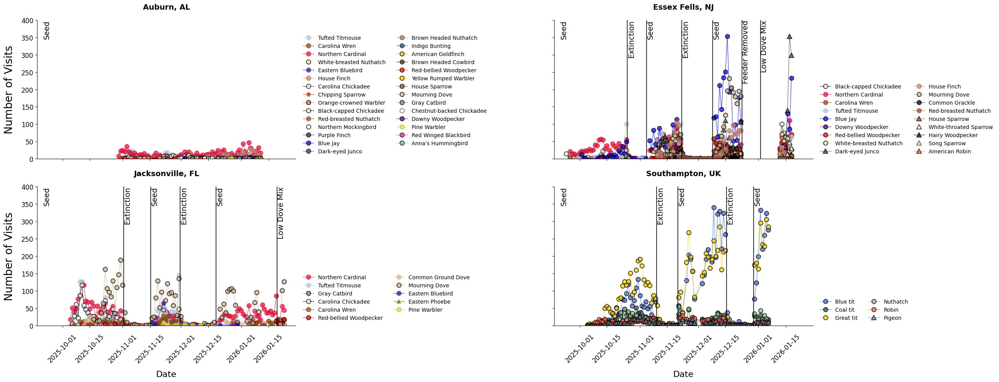


Birds that need specific colors added to bird_colors dictionary:
    'Anna's Hummingbird'
    'Purple Finch'
    'Red Winged Blackbird'
    'Orange-crowned Warbler'


In [4]:
# Define custom colors for each bird species
bird_colors = {
    'American Goldfinch': '#FEB813',        # Bright Yellow
    'American Robin': '#FF6347',            # Tomato red-orange
    'Black-capped Chickadee': '#FFFFFF',    # White
    'Blue Jay': '#0000FF',                  # Blue
    'Blue tit': '#4169E1',                  # Royal blue
    'Brown Headed Cowbird': '#411900',      # Chocolate Brown
    'Brown Headed Nuthatch': 'gray',        # Gray
    'Carolina Chickadee': '#FFFFFF',        # White
    'Carolina Wren': '#8B4513',             # Medium brown
    'Chestnut-backed Chickadee': 'white',   # White
    'Chipping Sparrow': '#A81C07',          # Rufous
    'Common Grackle': 'black',              # Black
    'Dark-eyed Junco': '#3C4043',           # Dark Gray
    'Downy Woodpecker': '#4B0082',          # Indigo (dark blue-purple)
    'Eastern Bluebird': '#0000FF',          # Blue
    'Eastern Phoebe': '#3C4043',            # Dark Gray
    'Coal tit': '#2F4F4F',                  # Dark slate gray
    'Common Ground Dove': '#D2B48C',        # Tan
    'Gray Catbird': '#808080',              # Gray
    'Great tit': '#FFD700',                 # Gold
    'Hairy Woodpecker': 'black',            # Black
    'House Finch': '#A7947F',               # Muted Brown-Gray
    'House Sparrow': '#954535',             # Chestnut
    'Indigo Bunting': '#213B4E',            # Dark Blue
    'Mourning Dove': '#D2B48C',             # Tan
    'Northern Cardinal': '#DC143C',         # Cardinal red
    'Northern Mockingbird': 'white',        # White
    'Nuthatch': '#8FBC8F',                  # Dark sea green
    'Pine Warbler': '#FFD700',              # Gold
    'Red-breasted Nuthatch': '#913E27',     # Cinnamon Red 
    'Red-bellied Woodpecker': '#FF0000',    # Red
    'Pigeon.1': '#708090',                  # Slate gray
    'Pigeon': '#708090',                    # Slate gray
    'Robin': '#FF6347',                     # Tomato red-orange
    'Song Sparrow': '#F3D2B5',              # Light Brown
    'Tufted Titmouse': '#B0C4DE',           # Light blue gray
    'White-breasted Nuthatch': '#F0E68C',   # Khaki (light yellow-green)
    'White-throated Sparrow': 'white',      # White
    'Yellow Rumped Warbler': '#FFD700',     # Gold
}

# Define marker edge colors for birds that need black outlines
bird_edge_colors = {
    'American Goldfinch': 'black', 
    'American Robin': 'black',
    'Black-capped Chickadee': 'black',
    'Blue Jay': 'black',
    'Blue tit': 'black',
    'Brown Headed Cowbird': '#411900',
    'Brown Headed Nuthatch': '#8B4513', 
    'Carolina Chickadee': 'black',
    'Carolina Wren': '#8B4513',
    'Chestnut-backed Chickadee': '#954535', 
    'Chipping Sparrow': '#D2B48C', 
    'Common Ground Dove': '#D2B48C',
    'Common Grackle': 'black', 
    'Coal tit': 'black',
    'Dark-eyed Junco': 'black',
    'Downy Woodpecker': 'black',
    'Eastern Bluebird': '#8B4513',
    'Eastern Phoebe': '#FFD700', 
    'Gray Catbird': 'black',
    'Great tit': 'black',
    'Hairy Woodpecker': 'black',
    'House Finch': '#D9534F',
    'House Sparrow': 'black',
    'Indigo Bunting': '#213B4E',
    'Mourning Dove': 'black',
    'Northern Cardinal': '#DC143C',
    'Northern Mockingbird': 'black',
    'Nuthatch': 'black',
    'Pigeon': 'black',
    'Pigeon.1': 'black',
    'Pine Warbler': '#8FBC8F', 
    'Red-breasted Nuthatch': '#886448', 
    'Red-bellied Woodpecker': 'black',
    'Robin': 'black',
    'Song Sparrow': '#62360F',
    'Tufted Titmouse': '#B0C4DE',
    'White-breasted Nuthatch': 'black',
    'White-throated Sparrow': 'black',
    'Yellow Rumped Warbler': 'black', 
}

# Define marker symbols for each bird species
bird_markers = {
    'American Goldfinch': '^',
    'American Robin': '^',
    'Black-capped Chickadee': 'o',
    'Blue tit': 'o',
    'Blue Jay': 'o',
    'Brown Headed Cowbird': '^',
    'Brown Headed Nuthatch': '^',
    'Carolina Chickadee': 'o',
    'Carolina Wren': 'o',
    'Chestnut-backed Chickadee': '^', 
    'Chipping Sparrow': '^', 
    'Coal tit': 'o',
    'Common Grackle': 'o', 
    'Common Ground Dove': 'o',
    'Dark-eyed Junco': '^',
    'Downy Woodpecker': 'o',
    'Eastern Bluebird': 'o',
    'Eastern Phoebe': '^', 
    'Gray Catbird': 'o',
    'Great tit': 'o',
    'Hairy Woodpecker': '^',
    'House Finch': 'o',
    'House Sparrow': '^',
    'Indigo Bunting': '^',
    'Mourning Dove': 'o',
    'Northern Cardinal': 'o',
    'Northern Mockingbird': '^',
    'Nuthatch': 'o',
    'Pigeon': '^',
    'Pigeon.1': '^',
    'Pine Warbler': 'o', 
    'Red-breasted Nuthatch': 'o', 
    'Red-bellied Woodpecker': 'o',
    'Robin': 'o',
    'Song Sparrow': '^',
    'Tufted Titmouse': 'o',
    'White-breasted Nuthatch': 'o',
    'White-throated Sparrow': '^',
    'Yellow Rumped Warbler': '^',
}

# Get unique locations
locations = sorted(daily_summs['source_sheet'].unique())
n_locations = len(locations)

# Create 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(26, 10), sharey=True, sharex=True)

# Flatten axes array for easier indexing
axes = axes.flatten()

# Track birds that need specific colors
birds_needing_colors = set()

# Plot each location separately
for i, location in enumerate(locations):
    ax = axes[i]
    location_data = daily_summs[daily_summs['source_sheet'] == location].dropna(subset=['Bird'])
    
    # Check for phase changes for this location
    location_phase_changes = phase_changes[phase_changes['LocationOfChange'] == location]
    
    # Get all phase change dates sorted chronologically
    phase_change_dates = []
    if not location_phase_changes.empty:
        phase_change_dates = sorted([
            pd.to_datetime(date) 
            for date in location_phase_changes['DateChangeStarted'].unique()
        ])
    
    # Plot each bird species individually with custom colors
    for bird in location_data['Bird'].unique():
        bird_data = location_data[location_data['Bird'] == bird].copy()
        bird_data = bird_data.sort_values('Date')
        bird_data['Date'] = pd.to_datetime(bird_data['Date'])
        
        # Check if bird has predefined colors
        if bird in bird_colors:
            line_color = bird_colors[bird]
            marker_color = bird_colors[bird]
            edge_color = bird_edge_colors.get(bird, 'black')
        else:
            # Generate random colors for unknown birds
            np.random.seed(hash(bird) % 2**32)  # Consistent colors per bird
            line_color = f'#{np.random.randint(0, 0xFFFFFF):06x}'
            marker_color = line_color
            edge_color = 'black'
            birds_needing_colors.add(bird)
        
        # Special handling for Carolina Chickadee
        if (bird == 'Carolina Chickadee') or (bird == 'Black-capped Chickadee'):
            line_color = '#000000'  # Black line
            marker_color = '#FFFFFF'  # White marker
        
        # Split data at all phase changes if they exist
        if len(phase_change_dates) > 0:
            # Create segments: before first change, between changes, after last change
            segments = []
            
            # First segment: before first phase change
            first_segment = bird_data[bird_data['Date'] < phase_change_dates[0]]
            if not first_segment.empty:
                segments.append(first_segment)
            
            # Middle segments: between consecutive phase changes
            for j in range(len(phase_change_dates) - 1):
                segment = bird_data[
                    (bird_data['Date'] >= phase_change_dates[j]) & 
                    (bird_data['Date'] < phase_change_dates[j + 1])
                ]
                if not segment.empty:
                    segments.append(segment)
            
            # Last segment: after last phase change
            last_segment = bird_data[bird_data['Date'] >= phase_change_dates[-1]]
            if not last_segment.empty:
                segments.append(last_segment)
            
            # Plot each segment separately
            for seg_idx, segment in enumerate(segments):
                if not segment.empty:
                    ax.plot(
                        segment['Date'], 
                        segment['Feeder Visits'], 
                        marker=bird_markers[bird], 
                        markersize=8,
                        markerfacecolor=marker_color,
                        markeredgecolor=edge_color,
                        markeredgewidth=1.5,
                        linewidth=1,
                        color=line_color,
                        label=bird if seg_idx == 0 else "",  # Only label first segment
                        alpha=0.7, 
                    )
        else:
            # No phase change, plot normally
            ax.plot(
                bird_data['Date'], 
                bird_data['Feeder Visits'], 
                marker='o', 
                markersize=8,
                markerfacecolor=marker_color,
                markeredgecolor=edge_color,
                markeredgewidth=1.5,
                linewidth=1,
                color=line_color,
                label=bird, 
                alpha=0.7
            )
    
    # Add phase change vertical lines for this location
    for _, phase_row in location_phase_changes.iterrows():
        change_date = pd.to_datetime(phase_row['DateChangeStarted'])
        description = phase_row['DescriptionOfChange']
        
        # Find the date before the change date
        location_dates = location_data['Date'].unique()
        location_dates = pd.to_datetime(location_dates)
        location_dates = np.sort(location_dates)
        
        # Find the date before the change date
        before_change_idx = np.where(location_dates < change_date)[0]
        if len(before_change_idx) > 0:
            date_before = location_dates[before_change_idx[-1]]
            # Calculate halfway point
            halfway_date = date_before + (change_date - date_before) / 2
            
            # Add vertical line
            ax.axvline(x=halfway_date, color='black', linestyle='-', linewidth=1.5, alpha=0.8)
            
            # Add description text
            ymax = daily_summs['Feeder Visits'].max()
            ax.text(halfway_date + pd.Timedelta(days=2), 400, description, 
                rotation=90, ha='center', va='top', fontsize=14)
    
    # Add "Seed" phase label at the beginning (to the right of y-axis)
    if not location_data.empty:
        first_date = pd.to_datetime('2025-09-22')
        ax.text(first_date + pd.Timedelta(days=1), 400, 'Seed', 
                rotation=90, ha='center', va='top', fontsize=14)
    
    # Set labels and formatting for each subplot
    # Only show ylabel on left column (i % 2 == 0)
    if i % 2 == 0:
        ax.set_ylabel('Number of Visits', fontsize=20, labelpad=12)
    else:
        ax.set_ylabel('')
    if i > 1:
        ax.set_xlabel('Date', fontsize=16, labelpad=12)
    else:
        ax.set_xlabel('')
    ax.set_title(location, fontsize=14, fontweight='bold', pad=20)
    
    # Set x-axis ticks (every 5th day)
    ticks = location_data['Date']
    ax.tick_params(labelsize=12)
    ax.tick_params(rotation=45, axis='x', pad=10)
    for label in ax.get_xticklabels():
        label.set_fontweight('normal')
        label.set_fontfamily('sans-serif')
    
    ax.set_ylim(0, 400)
    sns.despine(top=True, right=True)
    
    ax.legend(loc=(1.02, 0.02), frameon=False, fontsize=10, ncol=2)

plt.tight_layout()
plt.subplots_adjust(wspace=1, hspace=0.2)
plt.show()

# Print birds that need specific colors
if birds_needing_colors:
    print("\nBirds that need specific colors added to bird_colors dictionary:")
    for bird in birds_needing_colors:
        print(f"    '{bird}'")
else:
    print("\nAll birds have predefined colors.")

In [5]:
# Save species visits plot for dashboard
save_plot_for_dashboard(
    fig, 
    'species_visits_by_date', 
    'Daily Bird Feeder Visits by Species',
    'Line plot showing daily feeder visits for each bird species with custom color coding'
)

Saved: Daily Bird Feeder Visits by Species -> species_visits_by_date


'species_visits_by_date'

## Set up data for heatmap plots

In [6]:
# Build complete data and plot 3D surface using helpers for each location
_time_bins, _time_labels = build_time_bins()

# Dictionary to store data for each location
location_data = {}

# Get unique locations
locations = raw_data['source_sheet'].unique()

# Prepare complete data for each location
for location in locations:
    location_raw_data = raw_data[raw_data['source_sheet'] == location]
    complete_data, time_labels, dates, time_bin_indices, grouped_data = prepare_complete_data(location_raw_data, _time_bins)
    
    location_data[location] = {
        'complete_data': complete_data,
        'time_labels': time_labels,
        'dates': dates,
        'time_bin_indices': time_bin_indices,
        'grouped_data': grouped_data
    }

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2371872439.py:42: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['TimeBin'] = pd.to_datetime(df['Time']).apply(assign_time_bin)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2371872439.py:42: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['TimeBin'] = pd.to_datetime(df['Time']).apply(assign_time_bin)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2371872439.py:42: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['TimeBin'] = pd.to_datetime(df['Time']).apply(assign_time_

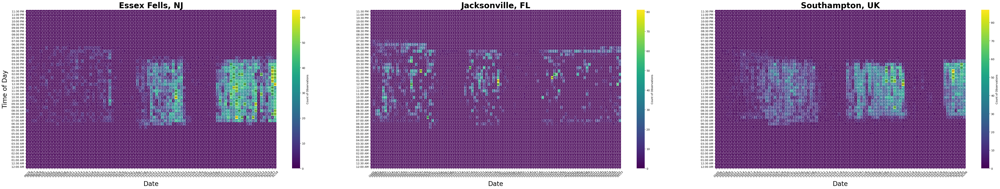

Saved: Heatmap: Date vs Time of Day as a Count of Observations -> heatmap_counts


'heatmap_counts'

In [7]:
# Plot heatmaps for each location
fig = plot_heatmap_counts_subplots(location_data)

# Save heatmap plots for dashboard
save_plot_for_dashboard(
    fig, 
    'heatmap_counts', 
    'Heatmap: Date vs Time of Day as a Count of Observations',
    'Heatmap showing bird activity patterns across dates and times of day for each location'
)

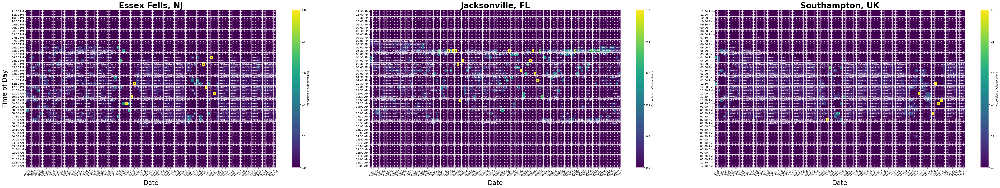

Saved: Heatmap: Date vs Time of Day as a Proportion of Observations -> heatmap_proportions


'heatmap_proportions'

In [8]:
# Plot proportions heatmaps for each location
fig = plot_heatmap_proportions_subplots(location_data)

# Save proportions heatmap for dashboard
save_plot_for_dashboard(
    fig, 
    'heatmap_proportions', 
    'Heatmap: Date vs Time of Day as a Proportion of Observations',
    'Heatmap showing proportional bird activity patterns across dates and times of day for each location'
)

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2371872439.py:163: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  ss_df['sunrise_local'] = pd.to_datetime(ss_df['sunrise_local'])
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2371872439.py:164: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  ss_df['sunset_local'] = pd.to_datetime(ss_df['sunset_local'])


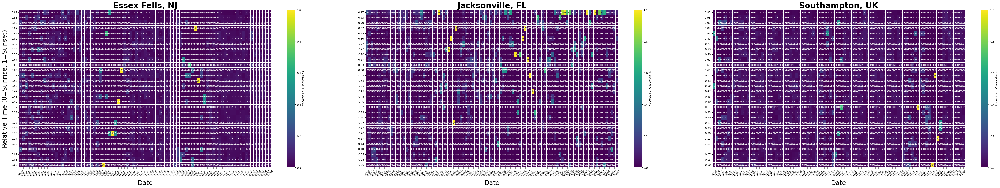

Saved: Heatmap: Date vs Relative Time Sunrise-Sunset as a Proportion of Observations -> heatmap_proportions_sunrise_sunset


'heatmap_proportions_sunrise_sunset'

In [9]:
# Load sunrise/sunset data
sunrise_sunset_df = load_sunrise_sunset_data()

# Prepare data for each location
location_data = {}
for location in raw_data['source_sheet'].unique():
    location_df = raw_data[raw_data['source_sheet'] == location]
    complete_data, bin_labels, dates, time_bin_indices = prepare_relative_time_data(
        location_df, 
        sunrise_sunset_df,
        location_col='source_sheet',
        n_bins=30
    )
    location_data[location] = {
        'complete_data': complete_data,
        'bin_labels': bin_labels
    }

# Plot the heatmap
fig = plot_heatmap_relative_time_proportions(location_data)

# Save proportions heatmap for dashboard
save_plot_for_dashboard(
    fig, 
    'heatmap_proportions_sunrise_sunset', 
    'Heatmap: Date vs Relative Time Sunrise-Sunset as a Proportion of Observations',
    'Heatmap showing proportional bird activity patterns across dates and relative times to sunrise-sunset for each location'
)

# Weather-Related Plots

In [10]:
# Read in weather data
weather_data = pd.read_csv('../data/hourly_weather.csv')
weather_data = weather_data[[
    'location', 'observed_dt_local', 
    'temp', 'feels_like',	'pressure',	'humidity',	'dew_point', 'clouds',
    'uvi', 'visibility', 'wind_speed', 'wind_gust', 'wind_deg',
    'rain_1h_mm', 'snow_1h_mm'
]]
weather_data['observed_dt_local'] = pd.to_datetime(weather_data['observed_dt_local'], utc=True, errors='coerce')
weather_data['date'] = weather_data['observed_dt_local'].dt.date
weather_data['hour'] = weather_data['observed_dt_local'].dt.hour
weather_data['location'] = weather_data['location'].astype(str).str.strip()
weather_data = weather_data.sort_values(['location', 'date', 'hour'])
weather_data.reset_index(drop=True, inplace=True)
weather_data = weather_data.drop(['observed_dt_local'], axis=1).fillna(0)
weather_data['date'] = weather_data['date'].astype(str)
weather_data['hour'] = weather_data['hour'].astype(int)

# Prep raw data for merge
raw_weather_data = raw_data.copy()
raw_weather_data = raw_weather_data[['Date', 'Time', 'Bird', 'source_sheet']].dropna(subset=['Time']).reset_index(drop=True)
raw_weather_data['Time'] = pd.to_datetime(raw_weather_data['Time'])
raw_weather_data['hour'] = raw_weather_data['Time'].dt.hour
raw_weather_data['hour'] = raw_weather_data['hour'].astype(int)
raw_weather_data.columns = ['date', 'time', 'bird', 'location', 'hour']
raw_weather_data['date'] = raw_weather_data['date'].astype(str)


# Merge weather data with raw data
raw_weather_data = raw_weather_data.merge(weather_data, on=['location', 'date', 'hour'], how='left')

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3086051433.py:22: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  raw_weather_data['Time'] = pd.to_datetime(raw_weather_data['Time'])


In [11]:
def prepare_hourly_data(df, species=None):
    """
    Aggregate row-level visit data to hourly counts + mean weather.

    Parameters
    ----------
    df : DataFrame
        Raw data with one row per visit.
    species : str or None
        If given, filter to that species first.

    Returns
    -------
    agg : DataFrame
        One row per (location, bird, date, hour) with count + weather features.
    X : DataFrame
        Design matrix of predictors.
    y : Series
        Visit count per hour.
    """
    if species is not None:
        df = df[df["bird"] == species].copy()

    # Ensure we only keep rows with all needed weather columns
    cols_needed = ["location", "bird", "date", "hour"] + WEATHER_COLS
    df = df[cols_needed].copy()

    # Aggregate to hourly counts and mean weather
    agg = (
        df
        .groupby(["location", "bird", "date", "hour"], as_index=False)
        .agg(
            visits=("bird", "size"),
            **{col: (col, "mean") for col in WEATHER_COLS}
        )
    )

    # Add time-of-day features (optional but helps models)
    agg["hour_sin"] = np.sin(2 * np.pi * agg["hour"] / 24)
    agg["hour_cos"] = np.cos(2 * np.pi * agg["hour"] / 24)

    feature_cols = WEATHER_COLS + ["hour_sin", "hour_cos"]
    X = agg[feature_cols].copy()
    y = agg["visits"].astype(float)

    # Apply min-max scaling to features
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    X = pd.DataFrame(X_scaled, columns=feature_cols, index=X.index)

    return agg, X, y


In [12]:
def get_models():
    """
    Return a dictionary of modeling approaches.
    Keys are model names, values are sklearn estimators or pipelines.
    """
    models = {}

    # Poisson regression (GLM-like). No scaling strictly needed, but harmless.
    models["Poisson"] = make_pipeline(
        StandardScaler(with_mean=False),
        PoissonRegressor(alpha=1e-6, max_iter=2000)
    )

    # Linear baseline (Ridge regression) for comparison
    models["Ridge"] = make_pipeline(
        StandardScaler(),
        Ridge(alpha=1.0)
    )

    # Random Forest
    models["RandomForest"] = RandomForestRegressor(
        n_estimators=1000,
        max_depth=None,
        min_samples_leaf=2,
        random_state=112225
    )

    # Gradient Boosting (fast, good default)
    models["HistGB"] = HistGradientBoostingRegressor(
        max_depth=None,
        learning_rate=0.05,
        max_iter=100,
        random_state=112225
    )

    # Neural network
    models["MLP"] = make_pipeline(
        StandardScaler(),
        MLPRegressor(
            hidden_layer_sizes=(128, 64, 64, 64, 32),
            activation="relu",
            solver="adam",
            max_iter=1000,
            random_state=112225,
            early_stopping=True, 
            alpha=0.0001, 
            learning_rate="adaptive", 
            batch_size='auto',
        )
    )

    return models


def evaluate_models_cv(X, y, models=None, cv_splits=5, use_cv_for_poisson=False):
    """
    For each model, get predictions (via cross-validation where appropriate)
    and residuals.

    Returns
    -------
    results : dict
        results[model_name] = {
            "y_pred": np.array,
            "residuals": np.array
        }
    """
    if models is None:
        models = get_models()

    cv = KFold(n_splits=cv_splits, shuffle=True, random_state=42)
    results = {}

    for name, estimator in models.items():
        if name == "Poisson" and not use_cv_for_poisson:
            # Fit once on full data, predict in-sample
            estimator.fit(X, y)
            y_pred = estimator.predict(X)
        else:
            # Out-of-fold predictions via cross-validation
            y_pred = cross_val_predict(
                estimator, X, y, cv=cv, n_jobs=-1, method="predict"
            )

        residuals = y - y_pred
        results[name] = {"y_pred": y_pred, "residuals": residuals}

    return results


In [13]:
def plot_model_comparison_grid(y, results, suptitle=None):
    """
    Create a 2 x N grid where N = number of models.

    Top row: Observed vs Predicted
    Bottom row: Residual vs Predicted
    """
    model_names = list(results.keys())
    n_models = len(model_names)

    fig, axes = plt.subplots(
        2, n_models, figsize=(4 * n_models, 8), sharey="row", sharex=True,
    )

    if n_models == 1:
        # Ensure 2xN indexing even when N=1
        axes = np.array(axes).reshape(2, 1)

    y = np.asarray(y)

    for j, name in enumerate(model_names):
        y_pred = np.asarray(results[name]["y_pred"])
        residuals = np.asarray(results[name]["residuals"])

        # Top: observed vs predicted
        ax_top = axes[0, j]
        ax_top.scatter(y_pred, y, alpha=0.4, s=10, color='black')
        min_val = min(y.min(), y_pred.min())
        max_val = max(y.max(), y_pred.max())
        ax_top.plot([min_val, max_val], [min_val, max_val], "k--", linewidth=1)
        ax_top.set_xlabel("", fontsize=20, labelpad=12)
        if j == 0:
            ax_top.set_ylabel("Observed visits", fontsize=20, labelpad=12)
        ax_top.set_title(name, fontsize=20, fontweight='bold')
        ax_top.set_xscale('log')
        ax_top.set_yscale('log')

        # Bottom: residuals vs predicted
        ax_bottom = axes[1, j]
        ax_bottom.scatter(y_pred, residuals, alpha=0.4, s=10, color='black')
        ax_bottom.axhline(0.0, color="k", linestyle="--", linewidth=1)
        ax_bottom.set_xlabel("Predicted visits", fontsize=20, labelpad=12)
        if j == 0:
            ax_bottom.set_ylabel("Residual (obs - pred)", fontsize=20, labelpad=12)
        ax_bottom.set_xscale('log')
        ax_bottom.set_yscale('symlog')

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)
    fig.tight_layout()
    plt.show()
    return fig


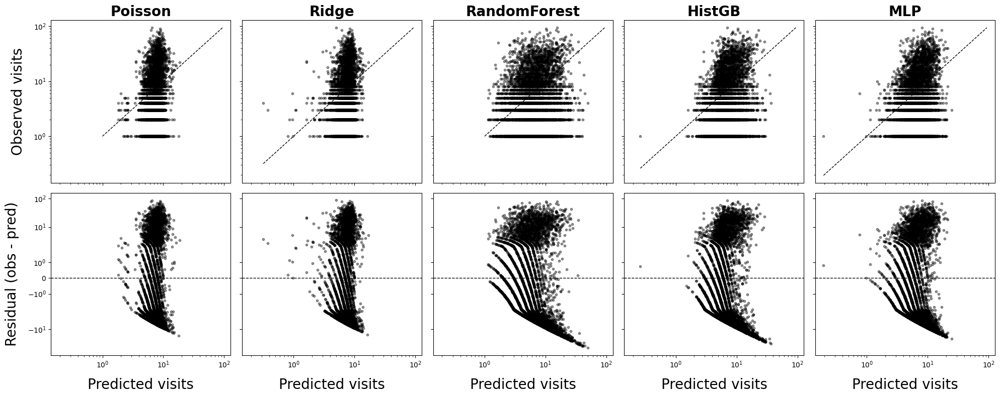

Saved: Can We Predict Visits from Weather? -> visit_predict_from_weather


'visit_predict_from_weather'

In [14]:
WEATHER_COLS = [
    "temp", "feels_like", "pressure", "humidity", "dew_point",
    "clouds", "uvi", "visibility", "wind_speed", "wind_gust",
    "wind_deg", "rain_1h_mm", "snow_1h_mm"
]

agg_all, X_all, y_all = prepare_hourly_data(raw_weather_data.fillna(0))
models = get_models()
results_all = evaluate_models_cv(X_all, y_all, models=models, cv_splits=5)

fig = plot_model_comparison_grid(y_all, results_all)
# plot_model_comparison_grid(y_gt, results_gt, suptitle="Great tit")

save_plot_for_dashboard(
    fig, 
    'visit_predict_from_weather', 
    'Can We Predict Visits from Weather?',
    'Test models to predict visits from weather'
)

/Users/davidjcox/Documents/SideProjects/backyard-ecology/venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidjcox/Documents/SideProjects/backyard-ecology/venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/Users/davidjcox/Documents/SideProjects/backyard-ecology/venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/davidjcox/Documents/SideProjects/backyard-ecology/venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/Users/davidjcox/Documents/SideProjects/backyard-ecology/venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divid

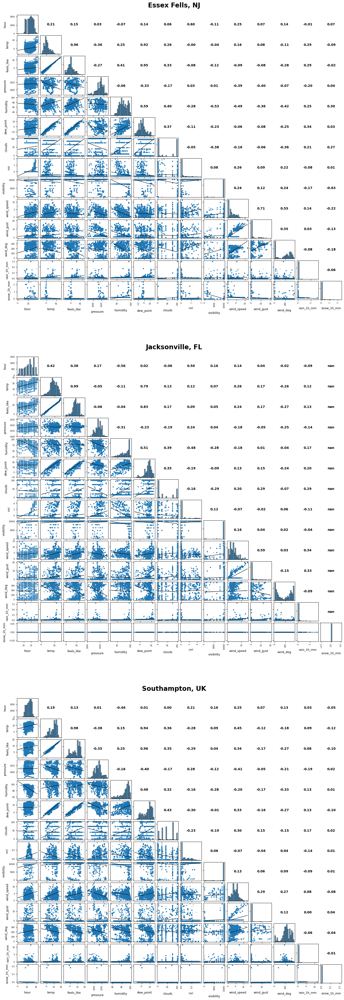

In [15]:
def plot_correlation_matrix(df, location_name, axes, n_vars, numeric_cols):
    # Get data for this location
    location_data = df[df['location'] == location_name][numeric_cols].copy()
    
    for i in range(n_vars):
        for j in range(n_vars):
            ax = axes[i, j]
            
            # --- PLOTTING ---
            if i == j:
                # Diagonal: Histogram
                ax.hist(location_data[numeric_cols[i]], bins=20, edgecolor='black', alpha=0.7)
            elif i > j:
                # Lower diagonal: Scatter
                sns.regplot(data=location_data, x=numeric_cols[j], y=numeric_cols[i], 
                           ax=ax, scatter_kws={'alpha': 0.3, 's': 4}, 
                           line_kws={'color': 'black', 'linewidth': 1}, ci=95)
            else:
                # Upper diagonal: Correlation
                # Handle NaNs for correlation calculation
                valid_idx = location_data[numeric_cols[j]].notna() & location_data[numeric_cols[i]].notna()
                if valid_idx.sum() > 1:
                    corr = location_data.loc[valid_idx, numeric_cols[j]].corr(location_data.loc[valid_idx, numeric_cols[i]])
                    ax.text(0.5, 0.5, f'{corr:.2f}', 
                                 ha='center', va='center', fontsize=10, fontweight='bold')
                ax.axis('off')

            # --- CLEANING LABELS (Crucial for spacing) ---
            # Only show Y labels for the first column (j==0)
            if j == 0:
                ax.set_ylabel(numeric_cols[i], fontsize=9, labelpad=10)
                ax.tick_params(axis='y', labelsize=6)
            else:
                ax.set_ylabel('')
                ax.set_yticklabels([]) # Hide ticks
                
            # Only show X labels for the last row (i==n_vars-1)
            if i == n_vars - 1:
                ax.set_xlabel(numeric_cols[j], fontsize=9, labelpad=10)
                ax.tick_params(axis='x', labelsize=6, rotation=90) # Rotate x labels for space
            else:
                ax.set_xlabel('')
                ax.set_xticklabels([]) # Hide ticks

# --- MAIN SETUP ---

# Get numeric columns
exclude_cols = ['date', 'time', 'bird', 'location']
numeric_cols = raw_weather_data.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = [col for col in numeric_cols if col not in exclude_cols]
n_vars = len(numeric_cols)

locations = sorted(raw_weather_data['location'].unique())
n_locations = len(locations)

# Create figure
# Increased height to accommodate the stack
fig = plt.figure(figsize=(18, 18 * n_locations)) 

# Outer Grid: 3 Rows, 1 Column
gs = gridspec.GridSpec(n_locations, 1, figure=fig, hspace=0.2)

for idx, location in enumerate(locations):
    # --- FIX 1: Add wspace/hspace here ---
    # This pushes the subplots APART within the matrix
    gs_sub = gridspec.GridSpecFromSubplotSpec(n_vars, n_vars, subplot_spec=gs[idx], 
                                              wspace=0.1, hspace=0.1)
    
    axes = np.empty((n_vars, n_vars), dtype=object)
    
    # Create axes
    for i in range(n_vars):
        for j in range(n_vars):
            axes[i, j] = fig.add_subplot(gs_sub[i, j])
            
    # Run Plotter
    plot_correlation_matrix(raw_weather_data, location, axes, n_vars, numeric_cols)

    # Add Title for the whole block
    box = gs[idx].get_position(fig)
    fig.text(0.5, box.y1 + 0.005, location, ha='center', va='bottom', fontsize=20, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

In [16]:
save_plot_for_dashboard(
    fig, 
    'cor_plot_weather_data', 
    'Correlation Matrix of Weather Data by Location',
    'Correlation matrix showing a regresson plot (lower diagonal), histogram (diagonal), and correlation coefficient (upper diagonal).'
)

Saved: Correlation Matrix of Weather Data by Location -> cor_plot_weather_data


'cor_plot_weather_data'

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3838569889.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["bird", "temp_bin", "wind_bin"])
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3838569889.py:20: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(


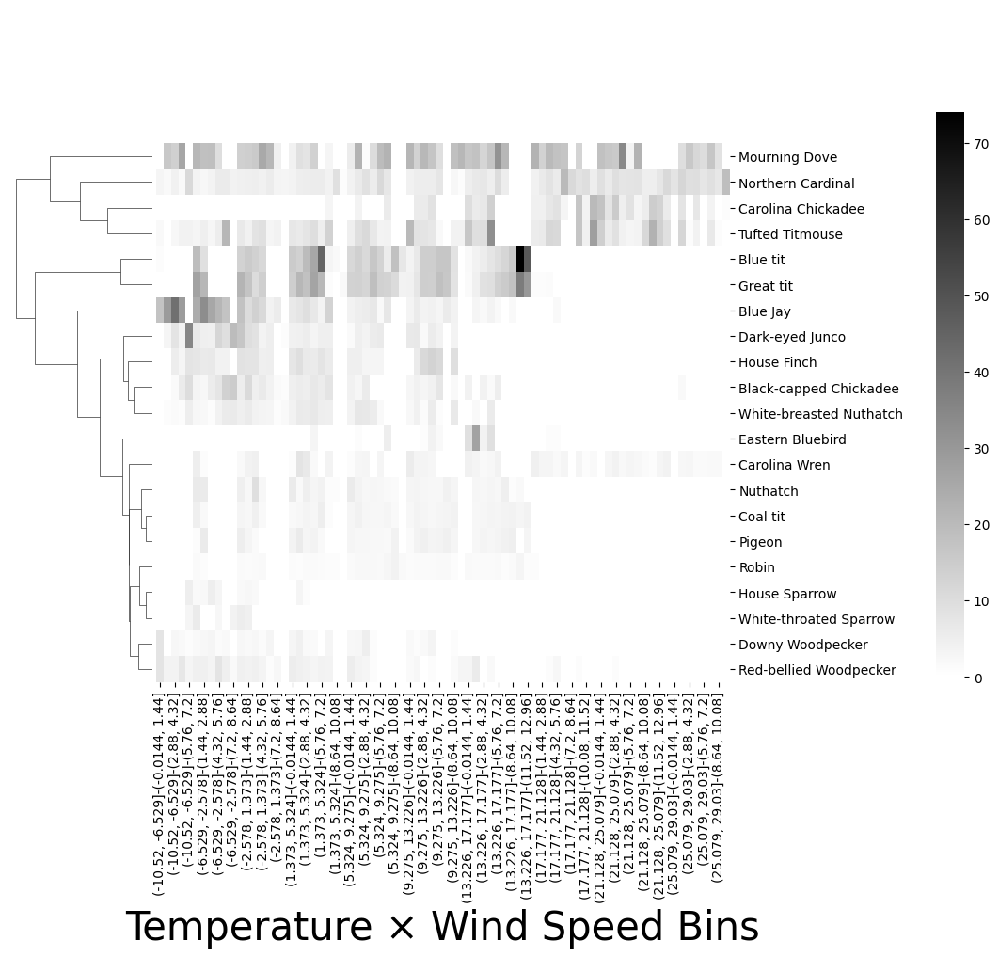

Saved: Species Clustermap Using Visits and Weather -> species_cluster_visits_by_weather


'species_cluster_visits_by_weather'

In [17]:
def build_species_weather_matrix(agg, temp_bins=10, wind_bins=10):
    """
    Build a species x (temp_bin x wind_bin) matrix of mean visit rates.
    """
    # Bin temperature and wind speed
    agg = agg.copy()
    agg["temp_bin"] = pd.cut(agg["temp"], bins=temp_bins)
    agg["wind_bin"]  = pd.cut(agg["wind_speed"], bins=wind_bins)

    # Filter to only birds with a certain number of visits. 
    bird_counts = agg.groupby("bird")["visits"].sum()
    birds_to_keep = bird_counts[bird_counts >= 50].index
    agg = agg[agg["bird"].isin(birds_to_keep)].reset_index(drop=True)

    pivot = (
        agg
        .groupby(["bird", "temp_bin", "wind_bin"])
        .agg(mean_visits=("visits", "mean"))
        .reset_index()
        .pivot_table(
            index="bird",
            columns=["temp_bin", "wind_bin"],
            values="mean_visits",
            fill_value=0.0
        )
    )
    return pivot


def cluster_species_by_weather(pivot, n_clusters=None):
    """
    Cluster species based on their temp x wind speed profiles.
    Returns linkage matrix and order.
    """
    # Convert to z-scores across columns
    X = StandardScaler().fit_transform(pivot.values)

    # Hierarchical clustering
    Z = linkage(X, method="ward")
    return Z


def plot_species_clustermap(pivot, Z):
    """
    Plot a clustered heatmap of species x weather bins.
    """
    # Use the linkage to order the rows
    fig = sns.clustermap(
        pivot,
        row_linkage=Z,
        col_cluster=False,
        cmap="gray_r", 
        cbar_pos=(1.0, 0.275, 0.03, 0.6)  # (left, bottom, width, height) in figure coordinates
    )
    # Set labels
    fig.ax_heatmap.set_xlabel("Temperature × Wind Speed Bins", fontsize=30, y=0)
    fig.ax_heatmap.set_ylabel("", fontsize=20, x=0)

    plt.show()
    return fig

agg_all, X_all, y_all = prepare_hourly_data(raw_weather_data.fillna(0))
pivot = build_species_weather_matrix(agg_all, temp_bins=10, wind_bins=10)
Z = cluster_species_by_weather(pivot)
fig = plot_species_clustermap(pivot, Z)

save_plot_for_dashboard(
    fig, 
    'species_cluster_visits_by_weather', 
    'Species Clustermap Using Visits and Weather',
    'Species clusters by weather'
)

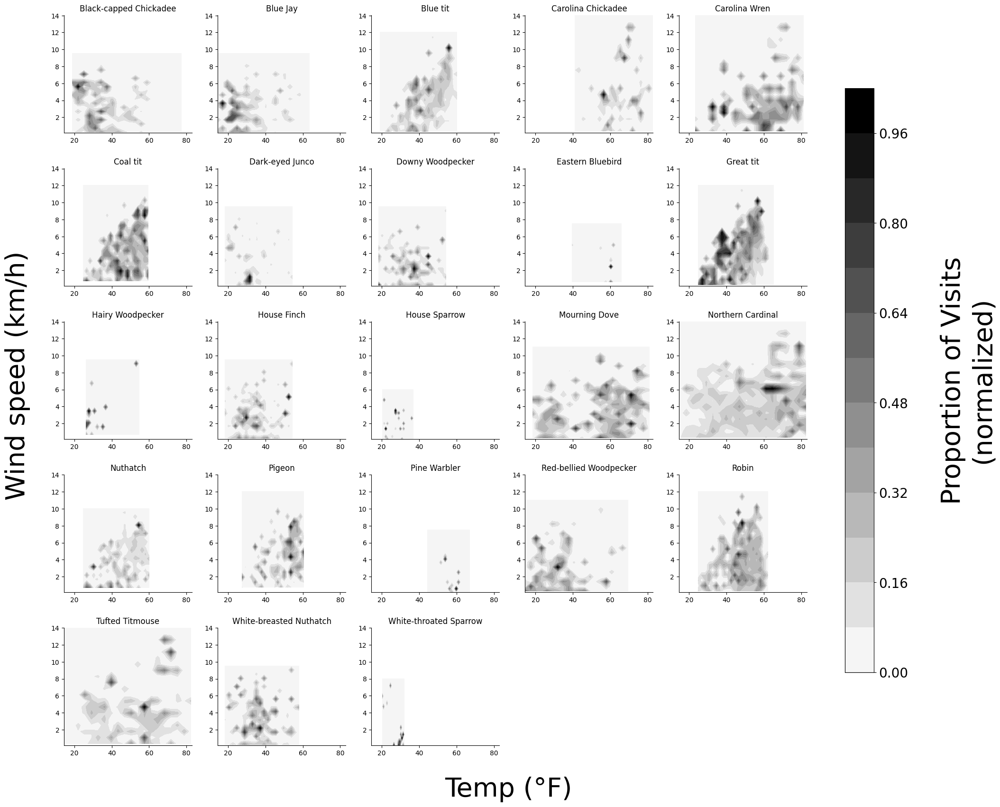

Saved: Proportion of visits by wind speed and temperature -> prop_visits_wind_temp


'prop_visits_wind_temp'

In [18]:
def plot_weather_contours(agg, x_col="temp", y_col="wind_speed",
                          x_bins=20, y_bins=20, species=None):
    """
    2D contour / heatmap of mean visit rate as a function of (x_col, y_col).
    If species is None, plot for each species in agg['bird'].
    Normalized to 0-1 proportions within each species.
    """
    if species is None:
        val_counts = agg["bird"].value_counts().reset_index()
        val_counts.columns = ["bird", "count"]
        val_counts = val_counts[val_counts["count"] > 10]
        species_list = sorted(val_counts["bird"].unique())
    else:
        species_list = [species]

    n_species = len(species_list)
    n_cols = min(n_species, 5)
    n_rows = int(np.ceil(n_species / n_cols))
    fig, axes = plt.subplots(
        n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), squeeze=False, 
        sharex=True, sharey=True
    )

    # Second pass: create plots with normalized proportions
    contour_objects = []
    for i, sp in enumerate(species_list):
        ax = axes[i // n_cols, i % n_cols]
        sub = agg[agg["bird"] == sp]

        # Bin
        x = sub[x_col].values
        # Convert temperature from Celsius to Fahrenheit if x_col is "temp"
        if x_col == "temp":
            x = (x * 9/5) + 32
        y = sub[y_col].values
        z = sub["visits"].values

        x_edges = np.linspace(x.min(), x.max(), x_bins + 1)
        y_edges = np.linspace(y.min(), y.max(), y_bins + 1)

        # Digitize to grid
        x_idx = np.digitize(x, x_edges) - 1
        y_idx = np.digitize(y, y_edges) - 1

        grid = np.full((x_bins, y_bins), np.nan)
        counts = np.zeros_like(grid)

        for xi, yi, zi in zip(x_idx, y_idx, z):
            if 0 <= xi < x_bins and 0 <= yi < y_bins:
                if np.isnan(grid[xi, yi]):
                    grid[xi, yi] = 0.0
                grid[xi, yi] += zi
                counts[xi, yi] += 1

        # Mean visits per bin
        with np.errstate(invalid="ignore", divide="ignore"):
            grid_mean = grid / counts
        grid_mean[np.isnan(grid_mean)] = 0.0
        
        # Normalize to 0-1 proportions within this species
        grid_max = grid_mean.max()
        if grid_max > 0:
            grid_mean = grid_mean / grid_max
        else:
            grid_mean = grid_mean  # Already all zeros

        Xc, Yc = np.meshgrid(
            0.5 * (x_edges[:-1] + x_edges[1:]),
            0.5 * (y_edges[:-1] + y_edges[1:]),
            indexing="ij"
        )

        cf = ax.contourf(Xc, Yc, grid_mean, levels=15, vmin=0, vmax=1, cmap='gray_r')
        contour_objects.append(cf)
        ax.set_title(sp)

    # Remove any empty subplots
    for j in range(i + 1, n_rows * n_cols):
        fig.delaxes(axes[j // n_cols, j % n_cols])

    # Configure ticks: show ticks and labels on all subplots
    for row in range(n_rows):
        for col in range(n_cols):
            if row < axes.shape[0] and col < axes.shape[1]:
                try:
                    ax = axes[row, col]
                    if ax in fig.axes:  # Check if axis still exists (not deleted)
                        # Show ticks and labels on all subplots
                        ax.tick_params(which='both', bottom=True, top=False, left=True, right=False, 
                                     labelbottom=True, labelleft=True)
                except (IndexError, AttributeError):
                    pass

    # Add single xlabel and ylabel for entire figure
    # Determine unit based on x_col
    if x_col == "temp":
        x_unit = "°F"
    else:
        x_unit = "°C"  # Keep original unit for other columns
    fig.supxlabel(f"{x_col.capitalize()} ({x_unit})", fontsize=40, y=0.05)
    fig.supylabel(f"{y_col.replace('_', ' ').capitalize()} (km/h)", fontsize=40, x=0.075)

    # Reserve space for colorbar BEFORE creating it
    fig.subplots_adjust(right=0.88, hspace=0.3)
    
    # Create colorbar in the reserved space
    cbar = fig.colorbar(contour_objects[-1], ax=axes, label="\nProportion of Visits\n(normalized)", 
                        location='right', pad=0.02, shrink=0.8)
    cbar.ax.yaxis.label.set_fontsize(40)
    for label in cbar.ax.get_yticklabels():
        label.set_fontsize(20)
    
    sns.despine(top=True, right=True)
    plt.show()
    return fig

agg_all, X_all, y_all = prepare_hourly_data(raw_weather_data.fillna(0))
fig = plot_weather_contours(agg_all, x_col="temp", y_col="wind_speed")

save_plot_for_dashboard(
    fig, 
    'prop_visits_wind_temp', 
    'Proportion of visits by wind speed and temperature',
    'Proportion of visits by wind speed and temperature'
)

# Bout Analyses

In [19]:
# Add inter-visit interval (IVI) data 
raw_data_ivi = pd.DataFrame()
for location in raw_data['source_sheet'].unique():
    location_data = raw_data[raw_data['source_sheet'] == location].copy()
    
    # Convert to datetime
    location_data['Date'] = pd.to_datetime(location_data['Date'])
    location_data['Time'] = pd.to_datetime(location_data['Time'])
    
    # Combine date and time, handling NaT values
    location_data['date_time'] = location_data['Date'] + pd.to_timedelta(location_data['Time'].dt.hour, unit='h') + pd.to_timedelta(location_data['Time'].dt.minute, unit='m') + pd.to_timedelta(location_data['Time'].dt.second, unit='s')
    location_data = location_data.sort_values(by='date_time', ascending=True).reset_index(drop=True)
    
    # Calculate IVI (inter-visit interval) in minutes
    location_data['IVI (mins)'] = location_data['date_time'].diff().dt.total_seconds() / 60
    
    raw_data_ivi = pd.concat([raw_data_ivi, location_data])

raw_data_ivi = raw_data_ivi.dropna(subset=['IVI (mins)']).reset_index(drop=True)

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/11940605.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  location_data['Time'] = pd.to_datetime(location_data['Time'])
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/11940605.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  location_data['Time'] = pd.to_datetime(location_data['Time'])
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/11940605.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  location_data['Time'] = pd.to_datetime(location_data['Time'])


In [20]:
# --- normalize in place ---
raw_data_ivi['source_sheet'] = raw_data_ivi['source_sheet'].astype(str).str.strip()
raw_data_ivi['Date'] = pd.to_datetime(raw_data_ivi['Date'], errors='coerce')

phase_changes['LocationOfChange'] = phase_changes['LocationOfChange'].astype(str).str.strip()
phase_changes['DateChangeStarted'] = pd.to_datetime(phase_changes['DateChangeStarted'], errors='coerce')

BASELINE = 'Seed'

def to_condition(txt: str) -> str:
    t = str(txt).lower()
    if 'seed' in t and 'extinct' not in t:
        return 'Seed'
    if 'extinct' in t or 'extinction' in t or 'no seed' in t:
        return 'No Seed'
    return 'No Seed'

phase_changes['Condition'] = phase_changes['DescriptionOfChange'].map(to_condition)

# Will hold the result keyed by the existing index of raw_data_ivi
seed_status = pd.Series(index=raw_data_ivi.index, dtype=object)

for loc, sub in raw_data_ivi.groupby('source_sheet'):
    loc_idx = sub.index
    dates = sub['Date'].to_numpy(dtype='datetime64[ns]')

    pc = (phase_changes
          .loc[phase_changes['LocationOfChange'].eq(loc),
               ['DateChangeStarted','Condition']]
          .sort_values('DateChangeStarted'))

    if pc.empty:
        seed_status.loc[loc_idx] = BASELINE
        continue

    change_dates = pc['DateChangeStarted'].to_numpy(dtype='datetime64[ns]')
    labels = pc['Condition'].to_numpy(object)

    # most recent change at or before each date (ties -> apply new change now)
    ix = np.searchsorted(change_dates, dates, side='right') - 1

    loc_status = np.where(ix >= 0, labels[np.clip(ix, 0, len(labels)-1)], BASELINE)
    seed_status.loc[loc_idx] = loc_status

# write back to the original df
raw_data_ivi['SeedStatus'] = seed_status

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3359017196.py:9: RuntimeWarning: overflow encountered in exp
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3359017196.py:9: RuntimeWarning: invalid value encountered in log
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3359017196.py:9: RuntimeWarning: overflow encountered in exp
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3359017196.py:9: RuntimeWarning: overflow encountered in exp
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)


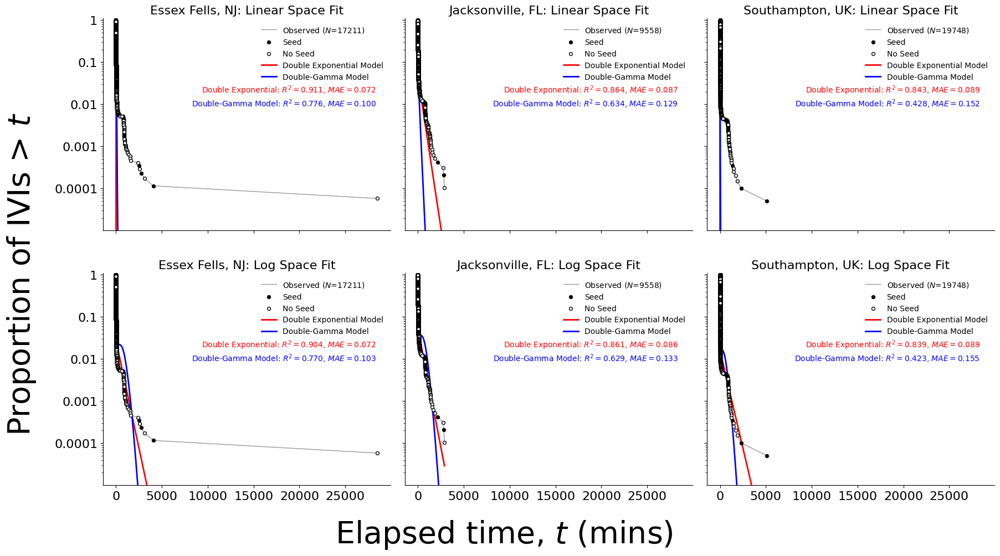

In [21]:
from scipy.special import gammainc, gamma

def double_exponential_survivor(t, A1, lambda1, A2, lambda2):
    """Double exponential survivor function (current model)"""
    return A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t)

def double_exponential_log_survivor(t, A1, lambda1, A2, lambda2):
    """Double exponential in log-space"""
    return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)

def double_gamma_pdf(x, Q, k_b, theta_b, k_w, theta_w):
    """Double-gamma probability density function from paper:
    p(IRT = x) = Q * [1 / (Γ(k_b) * θ_b^k_b)] * x^(k_b - 1) * e^(-x/θ_b)
                 + (1 - Q) * [1 / (Γ(k_w) * θ_w^k_w)] * x^(k_w - 1) * e^(-x/θ_w)
    """
    term_b = Q * (1.0 / (gamma(k_b) * (theta_b ** k_b))) * (x ** (k_b - 1)) * np.exp(-x / theta_b)
    term_w = (1.0 - Q) * (1.0 / (gamma(k_w) * (theta_w ** k_w))) * (x ** (k_w - 1)) * np.exp(-x / theta_w)
    return term_b + term_w

def double_gamma_survivor(t, Q, k_b, theta_b, k_w, theta_w):
    """Double-gamma survivor function: S(t) = 1 - CDF(t)
    where CDF is computed from the double-gamma PDF using incomplete gamma functions.
    
    For a gamma distribution with shape k and scale θ:
    CDF(x) = gammainc(k, x/θ) where gammainc is the regularized incomplete gamma function.
    """
    # Handle edge cases: ensure t is non-negative and parameters are valid
    t = np.maximum(t, 0)
    
    # CDF for gamma distribution: P(k, x/θ) where P is regularized incomplete gamma
    # gammainc(k, x) = P(k, x) = lower regularized incomplete gamma function
    cdf_b = gammainc(k_b, t / theta_b)  # CDF for between-bout component
    cdf_w = gammainc(k_w, t / theta_w)  # CDF for within-bout component
    cdf = Q * cdf_b + (1 - Q) * cdf_w
    
    # Survivor function: S(t) = 1 - CDF(t)
    # Ensure result is in valid range [0, 1] and handle numerical precision
    survivor = 1 - cdf
    survivor = np.clip(survivor, 1e-10, 1.0)  # Clip to avoid numerical issues
    
    return survivor

def double_gamma_log_survivor(t, Q, k_b, theta_b, k_w, theta_w):
    """Double-gamma survivor function in log-space for fitting"""
    return np.log(double_gamma_survivor(t, Q, k_b, theta_b, k_w, theta_w) + 1e-10)

# status → color (match what you want in the legend)
STATUS_PALETTE = [
    ('Seed', 'black'),
    ('No Seed', 'white'),
    ('Unknown', 'gray'),
]

# Get unique locations
locations = sorted(raw_data_ivi['source_sheet'].unique())
n_locations = len(locations)

# Create 2xN subplot layout (2 rows for fit types)
fig, axes = plt.subplots(2, n_locations, figsize=(6*n_locations, 10), sharey=True, sharex=True)
if n_locations == 1:
    axes = axes.reshape(2, 1)

def _dedupe_legend(ax):
    handles, labels = ax.get_legend_handles_labels()
    seen = set()
    h2, l2 = [], []
    for h, l in zip(handles, labels):
        if l not in seen:
            seen.add(l); h2.append(h); l2.append(l)
    ax.legend(h2, l2, loc='lower left', fontsize=10, frameon=False)

# Process each location
for col, location in enumerate(locations):
    # Get data for this location
    location_data = raw_data_ivi[raw_data_ivi['source_sheet'] == location]
    loc_df = location_data[['IVI (mins)', 'SeedStatus']].dropna().copy()
    if loc_df.empty:
        continue

    loc_df['SeedStatus'] = loc_df['SeedStatus'].fillna('Unknown')
    loc_df = loc_df.sort_values('IVI (mins)')

    # Survivor function inputs
    x = loc_df['IVI (mins)'].to_numpy()
    n = len(x)
    y = np.arange(n, 0, -1) / n
    status = loc_df['SeedStatus'].to_numpy()

    # Fitting
    time_points = x
    survivor = y
    initial_guess_current = [0.4, 0.5, 0.6, 0.02]
    # Initial guess for double-gamma model: Q=0.5, k_b=1.5, theta_b=2.0, k_w=1.0, theta_w=0.5
    # (k=1 gives exponential, so k>1 gives more flexibility)
    initial_guess_gamma = [0.5, 1.5, 2.0, 1.0, 0.5]

    try:
        # Current model: Linear-space fit
        popt_linear, pcov_linear = curve_fit(
            double_exponential_survivor, time_points, survivor,
            p0=initial_guess_current, maxfev=10000
        )
        y_pred_linear = double_exponential_survivor(time_points, *popt_linear)
        r_squared_linear = 1 - (np.sum((survivor - y_pred_linear) ** 2) /
                                np.sum((survivor - np.mean(survivor)) ** 2))
        mae_linear = float(np.mean(np.abs(survivor - y_pred_linear)))

        # Double-gamma model: Fit with bounds
        # Q in [0,1], k_b, k_w > 0 (shape parameters), theta_b, theta_w > 0 (scale parameters)
        popt_gamma, pcov_gamma = curve_fit(
            double_gamma_survivor, time_points, survivor,
            p0=initial_guess_gamma, maxfev=10000,
            bounds=([0, 0.1, 0.01, 0.1, 0.01], [1, 10, 100, 10, 10])
        )
        y_pred_gamma = double_gamma_survivor(time_points, *popt_gamma)
        r_squared_gamma = 1 - (np.sum((survivor - y_pred_gamma) ** 2) /
                               np.sum((survivor - np.mean(survivor)) ** 2))
        mae_gamma = float(np.mean(np.abs(survivor - y_pred_gamma)))

        # Log-space fit (current model)
        log_survivor = np.log(survivor + 1e-10)
        popt_log, pcov_log = curve_fit(
            double_exponential_log_survivor, time_points, log_survivor,
            p0=initial_guess_current, maxfev=10000
        )
        y_pred_log = double_exponential_log_survivor(time_points, *popt_log)
        y_pred_log_linear = np.exp(y_pred_log)
        r_squared_log = 1 - (np.sum((survivor - y_pred_log_linear) ** 2) /
                             np.sum((survivor - np.mean(survivor)) ** 2))
        mae_log = float(np.mean(np.abs(survivor - y_pred_log_linear)))

        # Double-gamma model: Log-space fit
        log_survivor = np.log(survivor + 1e-10)
        popt_gamma_log, pcov_gamma_log = curve_fit(
            double_gamma_log_survivor, time_points, log_survivor,
            p0=initial_guess_gamma, maxfev=10000,
            bounds=([0, 0.1, 0.01, 0.1, 0.01], [1, 10, 100, 10, 10])
        )
        # Transform back from log-space to linear-space for evaluation
        y_pred_gamma_log = double_gamma_survivor(time_points, *popt_gamma_log)
        r_squared_gamma_log = 1 - (np.sum((survivor - y_pred_gamma_log) ** 2) /
                                    np.sum((survivor - np.mean(survivor)) ** 2))
        mae_gamma_log = float(np.mean(np.abs(survivor - y_pred_gamma_log)))

        # Smooth fit curves
        t_smooth = np.linspace(0, x.max(), 200)
        y_smooth_linear = double_exponential_survivor(t_smooth, *popt_linear)
        y_smooth_gamma = double_gamma_survivor(t_smooth, *popt_gamma)
        y_smooth_log_linear = np.exp(double_exponential_log_survivor(t_smooth, *popt_log))
        # Transform back from log-space fit for plotting
        y_smooth_gamma_log = double_gamma_survivor(t_smooth, *popt_gamma_log)

        text_x = 0.95
        text_y = 0.65
        second_offset = 0.065

        # ---------- TOP: linear-space fit ----------
        ax1 = axes[0, col]
        ax1.semilogy(x, y, '-', linewidth=1, color='0.6', label=f'Observed ($N$={n})')

        # one scatter per SeedStatus (avoids long list for c=)
        for lbl, colr in STATUS_PALETTE:
            m = (status == lbl)
            if m.any():
                ax1.scatter(x[m], y[m], s=18, color=colr, edgecolor='black', zorder=3, label=lbl)

        ax1.semilogy(t_smooth, y_smooth_linear, '-', linewidth=2, color='red', label='Double Exponential Model')
        ax1.semilogy(t_smooth, y_smooth_gamma, '-', linewidth=2, color='blue', label='Double-Gamma Model')
        ax1.set_xlabel('')
        ax1.set_ylabel('')
        ax1.set_yticks([0.001, 0.01, 0.1, 1])
        ax1.set_yticklabels(['0.001', '0.01', '0.1', '1'], fontsize=16)
        ax1.tick_params(axis='x', labelsize=16)
        ax1.set_ylim(0.0001, 1.1)
        sns.despine(top=True, right=True, ax=ax1)

        # Add metrics for both models
        ax1.text(text_x, text_y, f'Double Exponential: $R^2 = {r_squared_linear:.3f}$, $MAE = {mae_linear:.3f}$',
                 transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.1, edgecolor='white'),
                 fontsize=10, ha='right', color='red')
        ax1.text(text_x, text_y-second_offset, f'Double-Gamma Model: $R^2 = {r_squared_gamma:.3f}$, $MAE = {mae_gamma:.3f}$',
                 transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.1, edgecolor='white'),
                 fontsize=10, ha='right', color='blue')
        ax1.set_title(f"{location}: Linear Space Fit", fontsize=16)
        _dedupe_legend(ax1)
        ax1.legend(loc='best', fontsize=10, frameon=False)

        # ---------- BOTTOM: log-space fit (shown in linear scale) ----------
        ax2 = axes[1, col]
        ax2.semilogy(x, y, '-', linewidth=1, color='0.6', label=f'Observed ($N$={n})')
        for lbl, colr in STATUS_PALETTE:
            m = (status == lbl)
            if m.any():
                ax2.scatter(x[m], y[m], s=18, color=colr, edgecolor='black', zorder=3, label=lbl)

        ax2.semilogy(t_smooth, y_smooth_log_linear, '-', linewidth=2, color='red', label='Double Exponential Model')
        ax2.semilogy(t_smooth, y_smooth_gamma_log, '-', linewidth=2, color='blue', label='Double-Gamma Model')
        ax2.set_xlabel('')
        ax2.set_ylabel('')
        ax2.set_yticks([0.0001, 0.001, 0.01, 0.1, 1])
        ax2.set_yticklabels(['0.0001', '0.001', '0.01', '0.1', '1'], fontsize=16)
        ax2.tick_params(axis='x', labelsize=16)
        ax2.set_ylim(0.00001, 1.1)
        sns.despine(top=True, right=True, ax=ax2)

        # Add metrics for both models
        ax2.text(text_x, text_y, f'Double Exponential: $R^2 = {r_squared_log:.3f}$, $MAE = {mae_log:.3f}$',
                 transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.1, edgecolor='white'),
                 fontsize=10, ha='right', color='red')
        ax2.text(text_x, text_y-second_offset, f'Double-Gamma Model: $R^2 = {r_squared_gamma_log:.3f}$, $MAE = {mae_gamma_log:.3f}$',
                 transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.1, edgecolor='white'),
                 fontsize=10, ha='right', color='blue')
        ax2.set_title(f"{location}: Log Space Fit", fontsize=16)
        _dedupe_legend(ax2)
        ax2.legend(loc='best', fontsize=10, frameon=False)

    except Exception as e:
        print(f"Error fitting data for {location}: {e}")
        axes[0, col].text(0.5, 0.5, f"Error fitting data\nfor {location}",
                          transform=axes[0, col].transAxes, ha='center', va='center')
        axes[1, col].text(0.5, 0.5, f"Error fitting data\nfor {location}",
                          transform=axes[1, col].transAxes, ha='center', va='center')

# Add single super labels
fig.supxlabel('Elapsed time, $t$ (mins)', fontsize=40, y=-0.0)
fig.supylabel('Proportion of IVIs > $t$', fontsize=40, x=0.0)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2, wspace=0.05)
plt.show()

In [22]:
# Save bout analysis plot for dashboard
save_plot_for_dashboard(
    fig, 
    'all_birds_bout_analysis', 
    'All Birds: Bout Analysis',
    'Analysis of bout durations for all birds'
)

Saved: All Birds: Bout Analysis -> all_birds_bout_analysis


'all_birds_bout_analysis'

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2214558134.py:10: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.iloc[1:] if len(x) > 1 else x)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2214558134.py:19: RuntimeWarning: overflow encountered in exp
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2214558134.py:19: RuntimeWarning: invalid value encountered in log
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/2214558134.py:19: RuntimeWarning: invalid value e

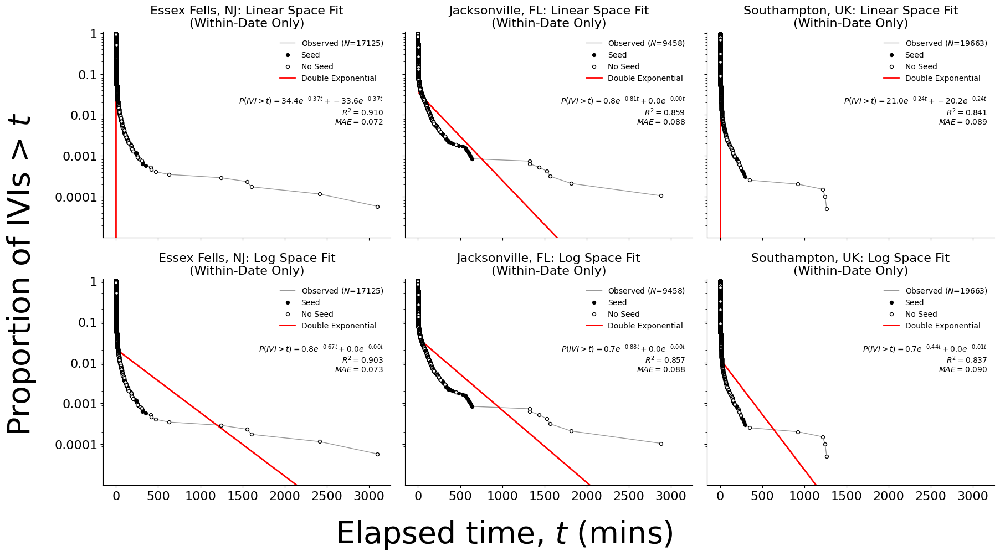

In [23]:
# Same plot as above but filtering out first IRT of each date (only using within-date IRTs)
# Filter raw_data_ivi to exclude the first IRT of each date (which represents cross-date interval)
raw_data_ivi_within_date = raw_data_ivi.copy()

# Group by location and date, then drop the first row of each group
# (the first row has the IVI from the previous date)
raw_data_ivi_within_date = (raw_data_ivi_within_date
    .sort_values(['source_sheet', 'Date', 'date_time'])
    .groupby(['source_sheet', 'Date'], group_keys=False)
    .apply(lambda x: x.iloc[1:] if len(x) > 1 else x)
    .reset_index(drop=True))

def double_exponential_survivor(t, A1, lambda1, A2, lambda2):
    """Double exponential survivor function"""
    return A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t)

def double_exponential_log_survivor(t, A1, lambda1, A2, lambda2):
    """Double exponential in log-space"""
    return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)

# status → color (match what you want in the legend)
STATUS_PALETTE = [
    ('Seed', 'black'),
    ('No Seed', 'white'),
    ('Unknown', 'gray'),
]

# Get unique locations
locations = sorted(raw_data_ivi_within_date['source_sheet'].unique())
n_locations = len(locations)

# Create 2xN subplot layout (2 rows for fit types)
fig, axes = plt.subplots(2, n_locations, figsize=(6*n_locations, 10), sharey=True, sharex=True)
if n_locations == 1:
    axes = axes.reshape(2, 1)

def _dedupe_legend(ax):
    handles, labels = ax.get_legend_handles_labels()
    seen = set()
    h2, l2 = [], []
    for h, l in zip(handles, labels):
        if l not in seen:
            seen.add(l); h2.append(h); l2.append(l)
    ax.legend(h2, l2, loc='lower left', fontsize=10, frameon=False)

# Process each location
for col, location in enumerate(locations):
    # Get data for this location
    location_data = raw_data_ivi_within_date[raw_data_ivi_within_date['source_sheet'] == location]
    loc_df = location_data[['IVI (mins)', 'SeedStatus']].dropna().copy()
    if loc_df.empty:
        continue

    loc_df['SeedStatus'] = loc_df['SeedStatus'].fillna('Unknown')
    loc_df = loc_df.sort_values('IVI (mins)')

    # Survivor function inputs
    x = loc_df['IVI (mins)'].to_numpy()
    n = len(x)
    y = np.arange(n, 0, -1) / n
    status = loc_df['SeedStatus'].to_numpy()

    # Fitting
    time_points = x
    survivor = y
    initial_guess = [0.4, 0.5, 0.6, 0.02]

    try:
        # Linear-space fit
        popt_linear, pcov_linear = curve_fit(
            double_exponential_survivor, time_points, survivor,
            p0=initial_guess, maxfev=10000
        )
        y_pred_linear = double_exponential_survivor(time_points, *popt_linear)
        r_squared_linear = 1 - (np.sum((survivor - y_pred_linear) ** 2) /
                                np.sum((survivor - np.mean(survivor)) ** 2))
        mae_linear = float(np.mean(np.abs(survivor - y_pred_linear)))

        # Log-space fit
        log_survivor = np.log(survivor + 1e-10)
        popt_log, pcov_log = curve_fit(
            double_exponential_log_survivor, time_points, log_survivor,
            p0=initial_guess, maxfev=10000
        )
        y_pred_log = double_exponential_log_survivor(time_points, *popt_log)
        y_pred_log_linear = np.exp(y_pred_log)
        r_squared_log = 1 - (np.sum((survivor - y_pred_log_linear) ** 2) /
                             np.sum((survivor - np.mean(survivor)) ** 2))
        mae_log = float(np.mean(np.abs(survivor - y_pred_log_linear)))

        # Smooth fit curves
        t_smooth = np.linspace(0, x.max(), 200)
        y_smooth_linear = double_exponential_survivor(t_smooth, *popt_linear)
        y_smooth_log_linear = np.exp(double_exponential_log_survivor(t_smooth, *popt_log))

        text_x = 0.975
        text_y = 0.65

        # ---------- TOP: linear-space fit ----------
        ax1 = axes[0, col]
        ax1.semilogy(x, y, '-', linewidth=1, color='0.6', label=f'Observed ($N$={n})')

        # one scatter per SeedStatus (avoids long list for c=)
        for lbl, colr in STATUS_PALETTE:
            m = (status == lbl)
            if m.any():
                ax1.scatter(x[m], y[m], s=18, color=colr, edgecolor='black', zorder=3, label=lbl)

        ax1.semilogy(t_smooth, y_smooth_linear, '-', linewidth=2, color='red', label='Double Exponential')
        ax1.set_xlabel('')
        ax1.set_ylabel('')
        ax1.set_yticks([0.0001, 0.001, 0.01, 0.1, 1])
        ax1.set_yticklabels(['0.0001', '0.001', '0.01', '0.1', '1'], fontsize=16)
        ax1.tick_params(axis='x', labelsize=16)
        ax1.set_ylim(0.00001, 1.1)
        sns.despine(top=True, right=True, ax=ax1)

        eq1 = (f'$P(IVI>t) = {popt_linear[0]:.1f}e^{{-{popt_linear[1]:.2f}t}}'
               f' + {popt_linear[2]:.1f}e^{{-{popt_linear[3]:.2f}t}}$')
        ax1.text(text_x, text_y, eq1, transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=10, ha='right')
        ax1.text(text_x, text_y-0.1, f'$R^2 = {r_squared_linear:.3f}$\n$MAE = {mae_linear:.3f}$',
                 transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=10, ha='right')
        ax1.set_title(f"{location}: Linear Space Fit\n(Within-Date Only)", fontsize=16)
        _dedupe_legend(ax1)
        ax1.legend(loc='best', fontsize=10, frameon=False)

        # ---------- BOTTOM: log-space fit (shown in linear scale) ----------
        ax2 = axes[1, col]
        ax2.semilogy(x, y, '-', linewidth=1, color='0.6', label=f'Observed ($N$={n})')
        for lbl, colr in STATUS_PALETTE:
            m = (status == lbl)
            if m.any():
                ax2.scatter(x[m], y[m], s=18, color=colr, edgecolor='black', zorder=3, label=lbl)

        ax2.semilogy(t_smooth, y_smooth_log_linear, '-', linewidth=2, color='red', label='Double Exponential')
        ax2.set_xlabel('')
        ax2.set_ylabel('')
        ax2.set_yticks([0.0001, 0.001, 0.01, 0.1, 1])
        ax2.set_yticklabels(['0.0001', '0.001', '0.01', '0.1', '1'], fontsize=16)
        ax2.tick_params(axis='x', labelsize=16)
        ax2.set_ylim(0.00001, 1.1)
        sns.despine(top=True, right=True, ax=ax2)

        eq2 = (f'$P(IVI>t) = {popt_log[0]:.1f}e^{{-{popt_log[1]:.2f}t}}'
               f' + {popt_log[2]:.1f}e^{{-{popt_log[3]:.2f}t}}$')
        ax2.text(text_x, text_y, eq2, transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=10, ha='right')
        ax2.text(text_x, text_y-0.1, f'$R^2 = {r_squared_log:.3f}$\n$MAE = {mae_log:.3f}$',
                 transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=10, ha='right')
        ax2.set_title(f"{location}: Log Space Fit\n(Within-Date Only)", fontsize=16)
        _dedupe_legend(ax2)
        ax2.legend(loc='best', fontsize=10, frameon=False)

    except Exception as e:
        print(f"Error fitting data for {location}: {e}")
        axes[0, col].text(0.5, 0.5, f"Error fitting data\nfor {location}",
                          transform=axes[0, col].transAxes, ha='center', va='center')
        axes[1, col].text(0.5, 0.5, f"Error fitting data\nfor {location}",
                          transform=axes[1, col].transAxes, ha='center', va='center')

# Add single super labels
fig.supxlabel('Elapsed time, $t$ (mins)', fontsize=40, y=-0.0)
fig.supylabel('Proportion of IVIs > $t$', fontsize=40, x=0.0)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2, wspace=0.05)
plt.show()


In [24]:
# Save bout analysis plot for dashboard
save_plot_for_dashboard(
    fig, 
    'all_birds_bout_analysis_within_date', 
    'All Birds: Bout Analysis (Within-Date Only)',
    'Analysis of bout durations for all birds (within-date only)'
)

Saved: All Birds: Bout Analysis (Within-Date Only) -> all_birds_bout_analysis_within_date


'all_birds_bout_analysis_within_date'

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/794168871.py:7: RuntimeWarning: overflow encountered in exp
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/794168871.py:3: RuntimeWarning: overflow encountered in exp
  return A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/794168871.py:7: RuntimeWarning: invalid value encountered in log
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/794168871.py:7: RuntimeWarning: overflow encountered in exp
  return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/794168871.py:3: RuntimeWarning: overflow encountered in exp
  return A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t)
/var/fo

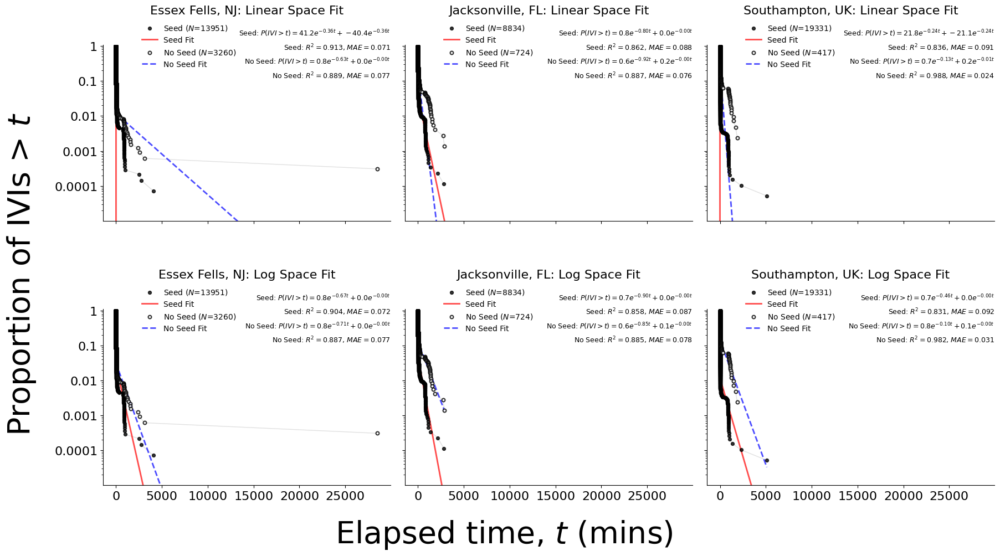

In [25]:
def double_exponential_survivor(t, A1, lambda1, A2, lambda2):
    """Double exponential survivor function"""
    return A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t)

def double_exponential_log_survivor(t, A1, lambda1, A2, lambda2):
    """Double exponential in log-space"""
    return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)

# Get unique locations
locations = sorted(raw_data_ivi['source_sheet'].unique())
n_locations = len(locations)

# Create 2xN subplot layout (2 rows for fit types)
fig, axes = plt.subplots(2, n_locations, figsize=(6*n_locations, 10), sharey=True, sharex=True)
if n_locations == 1:
    axes = axes.reshape(2, 1)

def _dedupe_legend(ax):
    handles, labels = ax.get_legend_handles_labels()
    seen = set()
    h2, l2 = [], []
    for h, l in zip(handles, labels):
        if l not in seen:
            seen.add(l); h2.append(h); l2.append(l)
    ax.legend(h2, l2, loc='lower left', fontsize=10, frameon=False)

def fit_model(df, initial_guess, use_log_space=False):
    """Helper function to fit model to a dataframe"""
    if df.empty or len(df) < 5:
        return None, None, None, None
    
    df = df.sort_values('IVI (mins)')
    x = df['IVI (mins)'].to_numpy()
    n = len(x)
    y = np.arange(n, 0, -1) / n
    time_points = x
    survivor = y
    
    try:
        if use_log_space:
            log_survivor = np.log(survivor + 1e-10)
            popt, pcov = curve_fit(
                double_exponential_log_survivor, time_points, log_survivor,
                p0=initial_guess, maxfev=10000
            )
            y_pred_log = double_exponential_log_survivor(time_points, *popt)
            y_pred = np.exp(y_pred_log)
        else:
            popt, pcov = curve_fit(
                double_exponential_survivor, time_points, survivor,
                p0=initial_guess, maxfev=10000
            )
            y_pred = double_exponential_survivor(time_points, *popt)
        
        r_squared = 1 - (np.sum((survivor - y_pred) ** 2) /
                         np.sum((survivor - np.mean(survivor)) ** 2))
        mae = float(np.mean(np.abs(survivor - y_pred)))
        
        return popt, pcov, r_squared, mae
    except Exception as e:
        return None, None, None, None

# Process each location
for col, location in enumerate(locations):
    # Get data for this location
    location_data = raw_data_ivi[raw_data_ivi['source_sheet'] == location]
    loc_df = location_data[['IVI (mins)', 'SeedStatus']].dropna().copy()
    if loc_df.empty:
        continue

    loc_df['SeedStatus'] = loc_df['SeedStatus'].fillna('Unknown')
    
    # Separate seed vs no seed data
    seed_df = loc_df[loc_df['SeedStatus'] == 'Seed'].copy()
    no_seed_df = loc_df[loc_df['SeedStatus'] == 'No Seed'].copy()
    
    initial_guess = [0.4, 0.5, 0.6, 0.02]
    
    # Fit models separately for seed and no seed
    popt_seed_linear, _, r2_seed_linear, mae_seed_linear = fit_model(seed_df, initial_guess, use_log_space=False)
    popt_seed_log, _, r2_seed_log, mae_seed_log = fit_model(seed_df, initial_guess, use_log_space=True)
    popt_no_seed_linear, _, r2_no_seed_linear, mae_no_seed_linear = fit_model(no_seed_df, initial_guess, use_log_space=False)
    popt_no_seed_log, _, r2_no_seed_log, mae_no_seed_log = fit_model(no_seed_df, initial_guess, use_log_space=True)
    
    # Get max time for smooth curves
    max_time = max(
        seed_df['IVI (mins)'].max() if not seed_df.empty else 0,
        no_seed_df['IVI (mins)'].max() if not no_seed_df.empty else 0
    )
    t_smooth = np.linspace(0, max_time, 200)
    
    text_x = 1
    text_y = 1.05
    
    # ---------- TOP: linear-space fit ----------
    ax1 = axes[0, col]
    
    # Plot seed data (black filled circles)
    if not seed_df.empty and len(seed_df) >= 5:
        seed_df_sorted = seed_df.sort_values('IVI (mins)')
        x_seed = seed_df_sorted['IVI (mins)'].to_numpy()
        n_seed = len(x_seed)
        y_seed = np.arange(n_seed, 0, -1) / n_seed
        ax1.semilogy(x_seed, y_seed, '-', linewidth=1, color='0.6', alpha=0.3)
        ax1.scatter(x_seed, y_seed, s=18, color='black', edgecolor='black', 
                   zorder=3, label=f'Seed ($N$={n_seed})', alpha=0.8)
        
        # Plot seed fit
        if popt_seed_linear is not None:
            y_smooth_seed = double_exponential_survivor(t_smooth, *popt_seed_linear)
            ax1.semilogy(t_smooth, y_smooth_seed, '-', linewidth=2, color='red', 
                        alpha=0.7, label='Seed Fit')
    
    # Plot no seed data (white/open circles)
    if not no_seed_df.empty and len(no_seed_df) >= 5:
        no_seed_df_sorted = no_seed_df.sort_values('IVI (mins)')
        x_no_seed = no_seed_df_sorted['IVI (mins)'].to_numpy()
        n_no_seed = len(x_no_seed)
        y_no_seed = np.arange(n_no_seed, 0, -1) / n_no_seed
        ax1.semilogy(x_no_seed, y_no_seed, '-', linewidth=1, color='0.6', alpha=0.3)
        ax1.scatter(x_no_seed, y_no_seed, s=18, facecolor='white', edgecolor='black', 
                   linewidth=1.5, zorder=3, label=f'No Seed ($N$={n_no_seed})', alpha=0.8)
        
        # Plot no seed fit
        if popt_no_seed_linear is not None:
            y_smooth_no_seed = double_exponential_survivor(t_smooth, *popt_no_seed_linear)
            ax1.semilogy(t_smooth, y_smooth_no_seed, '--', linewidth=2, color='blue', 
                        alpha=0.7, label='No Seed Fit')
    
    ax1.set_xlabel('')
    ax1.set_ylabel('')
    ax1.set_yticks([0.0001, 0.001, 0.01, 0.1, 1])
    ax1.set_yticklabels(['0.0001', '0.001', '0.01', '0.1', '1'], fontsize=16)
    ax1.tick_params(axis='x', labelsize=16)
    ax1.set_ylim(0.00001, 1.1)
    sns.despine(top=True, right=True, ax=ax1)
    
    # Add equations and metrics
    if popt_seed_linear is not None:
        eq_seed = (f'Seed: $P(IVI>t) = {popt_seed_linear[0]:.1f}e^{{-{popt_seed_linear[1]:.2f}t}}'
                  f' + {popt_seed_linear[2]:.1f}e^{{-{popt_seed_linear[3]:.2f}t}}$')
        ax1.text(text_x, text_y, eq_seed, transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
        ax1.text(text_x, text_y-0.08, f'Seed: $R^2 = {r2_seed_linear:.3f}$, $MAE = {mae_seed_linear:.3f}$',
                 transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
    
    if popt_no_seed_linear is not None:
        eq_no_seed = (f'No Seed: $P(IVI>t) = {popt_no_seed_linear[0]:.1f}e^{{-{popt_no_seed_linear[1]:.2f}t}}'
                     f' + {popt_no_seed_linear[2]:.1f}e^{{-{popt_no_seed_linear[3]:.2f}t}}$')
        y_offset = text_y - 0.16 if popt_seed_linear is not None else text_y
        ax1.text(text_x, y_offset, eq_no_seed, transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
        y_offset_metrics = text_y - 0.24 if popt_seed_linear is not None else text_y - 0.08
        ax1.text(text_x, y_offset_metrics, f'No Seed: $R^2 = {r2_no_seed_linear:.3f}$, $MAE = {mae_no_seed_linear:.3f}$',
                 transform=ax1.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
    
    ax1.set_title(f"{location}: Linear Space Fit", fontsize=16, pad=40)
    _dedupe_legend(ax1)
    ax1.legend(loc=(0.125, 0.85), fontsize=10, frameon=False)

    # ---------- BOTTOM: log-space fit (shown in linear scale) ----------
    ax2 = axes[1, col]
    
    # Plot seed data (black filled circles)
    if not seed_df.empty and len(seed_df) >= 5:
        seed_df_sorted = seed_df.sort_values('IVI (mins)')
        x_seed = seed_df_sorted['IVI (mins)'].to_numpy()
        n_seed = len(x_seed)
        y_seed = np.arange(n_seed, 0, -1) / n_seed
        ax2.semilogy(x_seed, y_seed, '-', linewidth=1, color='0.6', alpha=0.3)
        ax2.scatter(x_seed, y_seed, s=18, color='black', edgecolor='black', 
                   zorder=3, label=f'Seed ($N$={n_seed})', alpha=0.8)
        
        # Plot seed fit
        if popt_seed_log is not None:
            y_smooth_seed = np.exp(double_exponential_log_survivor(t_smooth, *popt_seed_log))
            ax2.semilogy(t_smooth, y_smooth_seed, '-', linewidth=2, color='red', 
                        alpha=0.7, label='Seed Fit')
    
    # Plot no seed data (white/open circles)
    if not no_seed_df.empty and len(no_seed_df) >= 5:
        no_seed_df_sorted = no_seed_df.sort_values('IVI (mins)')
        x_no_seed = no_seed_df_sorted['IVI (mins)'].to_numpy()
        n_no_seed = len(x_no_seed)
        y_no_seed = np.arange(n_no_seed, 0, -1) / n_no_seed
        ax2.semilogy(x_no_seed, y_no_seed, '-', linewidth=1, color='0.6', alpha=0.3)
        ax2.scatter(x_no_seed, y_no_seed, s=18, facecolor='white', edgecolor='black', 
                   linewidth=1.5, zorder=3, label=f'No Seed ($N$={n_no_seed})', alpha=0.8)
        
        # Plot no seed fit
        if popt_no_seed_log is not None:
            y_smooth_no_seed = np.exp(double_exponential_log_survivor(t_smooth, *popt_no_seed_log))
            ax2.semilogy(t_smooth, y_smooth_no_seed, '--', linewidth=2, color='blue', 
                        alpha=0.7, label='No Seed Fit')
    
    ax2.set_xlabel('')
    ax2.set_ylabel('')
    ax2.set_yticks([0.0001, 0.001, 0.01, 0.1, 1])
    ax2.set_yticklabels(['0.0001', '0.001', '0.01', '0.1', '1'], fontsize=16)
    ax2.tick_params(axis='x', labelsize=16)
    ax2.set_ylim(0.00001, 1.1)
    sns.despine(top=True, right=True, ax=ax2)
    
    # Add equations and metrics
    if popt_seed_log is not None:
        eq_seed = (f'Seed: $P(IVI>t) = {popt_seed_log[0]:.1f}e^{{-{popt_seed_log[1]:.2f}t}}'
                  f' + {popt_seed_log[2]:.1f}e^{{-{popt_seed_log[3]:.2f}t}}$')
        ax2.text(text_x, text_y, eq_seed, transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
        ax2.text(text_x, text_y-0.08, f'Seed: $R^2 = {r2_seed_log:.3f}$, $MAE = {mae_seed_log:.3f}$',
                 transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
    
    if popt_no_seed_log is not None:
        eq_no_seed = (f'No Seed: $P(IVI>t) = {popt_no_seed_log[0]:.1f}e^{{-{popt_no_seed_log[1]:.2f}t}}'
                     f' + {popt_no_seed_log[2]:.1f}e^{{-{popt_no_seed_log[3]:.2f}t}}$')
        y_offset = text_y - 0.16 if popt_seed_log is not None else text_y
        ax2.text(text_x, y_offset, eq_no_seed, transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
        y_offset_metrics = text_y - 0.24 if popt_seed_log is not None else text_y - 0.08
        ax2.text(text_x, y_offset_metrics, f'No Seed: $R^2 = {r2_no_seed_log:.3f}$, $MAE = {mae_no_seed_log:.3f}$',
                 transform=ax2.transAxes,
                 bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
                 fontsize=9, ha='right')
    
    ax2.set_title(f"{location}: Log Space Fit", fontsize=16, pad=40)
    _dedupe_legend(ax2)
    ax2.legend(loc=(0.125, 0.85), fontsize=10, frameon=False)

# Add single super labels
fig.supxlabel('Elapsed time, $t$ (mins)', fontsize=40, y=-0.0)
fig.supylabel('Proportion of IVIs > $t$', fontsize=40, x=0.0)

plt.tight_layout()
plt.subplots_adjust(hspace=0.5, wspace=0.05)
plt.show()

In [26]:
# Save bout analysis plot for dashboard
save_plot_for_dashboard(
    fig, 
    'all_birds_bout_seed_no_seed_separate', 
    'All Birds: Bout Analysis Separating Seed and No Seed Conditions',
    'Analysis of bout durations for all birds'
)

Saved: All Birds: Bout Analysis Separating Seed and No Seed Conditions -> all_birds_bout_seed_no_seed_separate


'all_birds_bout_seed_no_seed_separate'

## Fit within each species

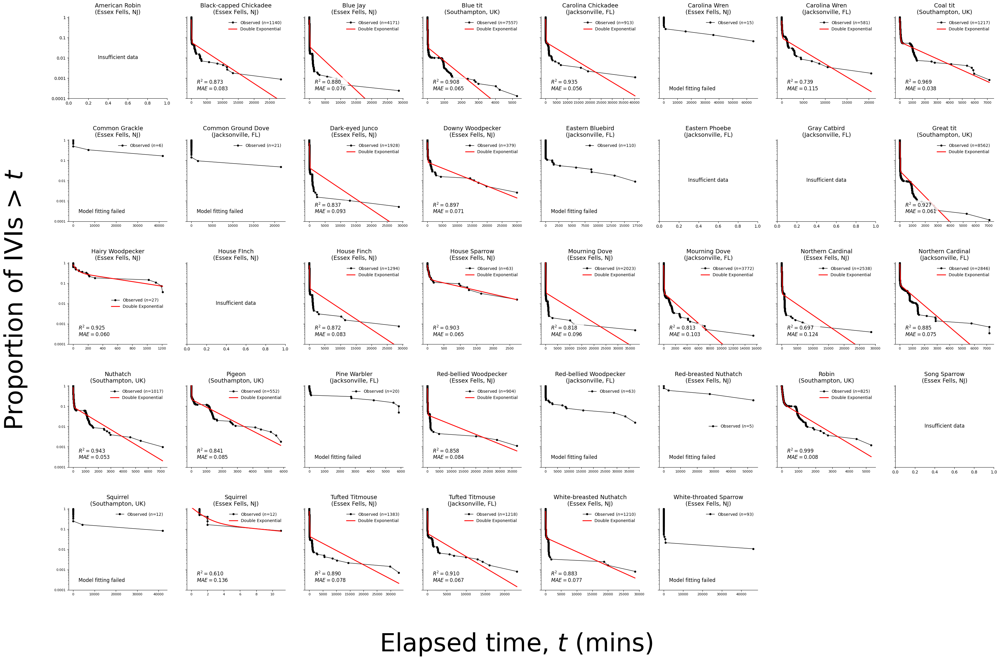

In [27]:
def double_exponential_log_survivor(t, A1, lambda1, A2, lambda2):
    """Double exponential in log-space"""
    return np.log(A1 * np.exp(-lambda1 * t) + A2 * np.exp(-lambda2 * t) + 1e-10)

def fit_bout_model_for_bird(data, bird_species):
    # Data is already filtered by bird and location, so just extract IVI values
    bird_data = data['IVI (mins)'].dropna()
    
    if len(bird_data) < 5:
        return None, None, None, None
    
    sorted_ivi = np.sort(bird_data)
    n = len(sorted_ivi)
    survivor = np.arange(n, 0, -1) / n
    time_points = sorted_ivi
    
    # Work in log-space
    log_survivor = np.log(survivor + 1e-10)
    
    # More flexible initial guess based on data characteristics
    mean_ivi = bird_data.mean()
    std_ivi = bird_data.std()
    
    # Try multiple initial guesses
    initial_guesses = [
        [0.8, 1.0/mean_ivi, 0.2, 0.01/mean_ivi],  # Original
        [0.6, 0.5/mean_ivi, 0.4, 0.05/mean_ivi],   # Alternative 1
        [0.9, 2.0/mean_ivi, 0.1, 0.001/mean_ivi],   # Alternative 2
        [0.5, 0.1/mean_ivi, 0.5, 0.1/mean_ivi],     # Alternative 3
    ]
    
    # Much more relaxed bounds
    bounds = ([0.01, 0.001, 0.01, 0.0001], [1.0, 50, 1.0, 10])
    
    for initial_guess in initial_guesses:
        try:
            # Fit in log-space
            popt, pcov = curve_fit(double_exponential_log_survivor, time_points, log_survivor, 
                                 p0=initial_guess, bounds=bounds, maxfev=20000)
            
            # Convert back to linear space for evaluation
            y_pred_log = double_exponential_log_survivor(time_points, *popt)
            y_pred = np.exp(y_pred_log)
            
            # Calculate metrics in linear space
            r_squared = 1 - (np.sum((survivor - y_pred) ** 2) / np.sum((survivor - np.mean(survivor)) ** 2))
            mae = np.mean(np.abs(survivor - y_pred))
            
            # Only return if we get a reasonable fit
            # Lower threshold to allow more birds to get fits (was 0.5)
            if r_squared > 0.1:  # Minimum R² threshold
                return popt, pcov, r_squared, mae
                
        except:
            continue
    
    return None, None, None, None

# First, calculate IVIs for each bird separately
raw_data_ivi = pd.DataFrame()

# Get unique bird-location combinations
raw_data = raw_data.dropna(subset=['Bird'])
# raw_data = raw_data[raw_data['Bird'] != 'Gray Catbird']
bird_location_pairs = raw_data[['Bird', 'source_sheet']].drop_duplicates()

for _, row in bird_location_pairs.iterrows():
    bird = row['Bird']
    location = row['source_sheet']
    
    # Get data for this specific bird-location combination
    bird_data = raw_data[(raw_data['Bird'] == bird) & (raw_data['source_sheet'] == location)].copy()
    
    if len(bird_data) < 5:  # Skip if insufficient data
        continue
    
    # Convert to datetime with explicit format to avoid warnings
    bird_data['Date'] = pd.to_datetime(bird_data['Date'], format='%Y-%m-%d')
    bird_data['Time'] = pd.to_datetime(bird_data['Time'], format='%H:%M:%S')
    
    # Combine date and time, handling NaT values
    bird_data['date_time'] = bird_data['Date'] + pd.to_timedelta(bird_data['Time'].dt.hour, unit='h') + pd.to_timedelta(bird_data['Time'].dt.minute, unit='m') + pd.to_timedelta(bird_data['Time'].dt.second, unit='s')
    bird_data = bird_data.sort_values(by='date_time', ascending=True).reset_index(drop=True)
    
    # Calculate IVI (inter-visit interval) in minutes
    bird_data['IVI (mins)'] = bird_data['date_time'].diff().dt.total_seconds() / 60
    
    raw_data_ivi = pd.concat([raw_data_ivi, bird_data])

# Remove rows with NaN IVI values
raw_data_ivi = raw_data_ivi.dropna(subset=['IVI (mins)'])

# Sort by bird name
bird_location_pairs = bird_location_pairs.sort_values('Bird')

# Calculate number of subplots needed for square-ish layout
n_species = len(bird_location_pairs)
n_cols = 8
n_rows = int(np.ceil(n_species / n_cols))  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows), sharey=True)
if n_rows == 1:
    axes = axes.reshape(1, -1)
elif n_cols == 1:
    axes = axes.reshape(-1, 1)

# Plot for each bird species
for i, (_, row) in enumerate(bird_location_pairs.iterrows()):
    bird = row['Bird']
    location = row['source_sheet']
    
    row_idx = i // n_cols
    col_idx = i % n_cols
    ax = axes[row_idx, col_idx]
    
    # Get data for this bird-location combination
    bird_data = raw_data_ivi[(raw_data_ivi['Bird'] == bird) & (raw_data_ivi['source_sheet'] == location)]['IVI (mins)'].dropna()
    
    if len(bird_data) < 5:
        ax.text(0.5, 0.5, f'Insufficient data', 
                ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{bird}\n({location})', fontsize=14)
        sns.despine(top=True, right=True)
        continue
    
    # Sort the data
    sorted_ivi = np.sort(bird_data)
    
    # Calculate survivor function
    n = len(sorted_ivi)
    survivor = np.arange(n, 0, -1) / n
    
    # Create time points for fitting
    time_points = sorted_ivi
    
    # Fit the model
    popt, pcov, r_squared, mae = fit_bout_model_for_bird(raw_data_ivi[(raw_data_ivi['Bird'] == bird) & (raw_data_ivi['source_sheet'] == location)], bird)
    
    if popt is not None:
        # Plot observed data
        ax.semilogy(time_points, survivor, 'ko-', markersize=4, linewidth=1, 
                   label=f'Observed ($n$={len(bird_data)})')
        
        # Plot fitted model - transform back to linear space
        t_smooth = np.linspace(0, bird_data.max(), 100)
        y_smooth_log = double_exponential_log_survivor(t_smooth, *popt)
        y_smooth = np.exp(y_smooth_log)
        ax.semilogy(t_smooth, y_smooth, 'r-', linewidth=2, 
                   label=f'Double Exponential')
        
        # Plot individual components - transform back to linear space
        within_bout_log = np.log(popt[0] * np.exp(-popt[1] * t_smooth) + 1e-10)
        between_bout_log = np.log(popt[2] * np.exp(-popt[3] * t_smooth) + 1e-10)
        within_bout = np.exp(within_bout_log)
        between_bout = np.exp(between_bout_log)
        
        text_x = 0.1
        
        # Add metrics text
        metrics_text = f'$R^2 = {r_squared:.3f}$\n$MAE = {mae:.3f}$'
        ax.text(text_x, 0.1, metrics_text, transform=ax.transAxes, 
               bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
               fontsize=12)
    else:
        # Plot just the observed data if model fitting failed
        ax.semilogy(time_points, survivor, 'ko-', markersize=4, linewidth=1, 
                   label=f'Observed ($n$={len(bird_data)})')
        metrics_text = f'Model fitting failed'
        ax.text(text_x, 0.1, metrics_text, transform=ax.transAxes, 
               bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor='white'),
               fontsize=12)
    
    # Remove individual labels
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    # Set formatting
    ax.legend(loc='best', fontsize=10, frameon=False)
    ax.set_yticks(ticks=[0.0001, 0.001, 0.01, 0.1, 1], 
                  labels=['0.0001', '0.001', '0.01', '0.1', '1'], 
                  fontsize=8)
    ax.tick_params(axis='x', labelsize=8)
    ax.set_ylim(0.0001, 1.1)
    ax.set_title(f'{bird}\n({location})', fontsize=14)
    
    sns.despine(top=True, right=True)

# Hide empty subplots
for i in range(n_species, n_rows * n_cols):
    row_idx = i // n_cols
    col_idx = i % n_cols
    axes[row_idx, col_idx].set_visible(False)

# Add single super labels
fig.supxlabel('Elapsed time, $t$ (mins)', fontsize=60, y=0.02)
fig.supylabel('Proportion of IVIs > $t$', fontsize=60, x=0.07)

plt.subplots_adjust(hspace=0.5, wspace=0.2)
plt.show()

In [28]:
# Save migration correlation plot for dashboard
save_plot_for_dashboard(
    fig, 
    'individual_species_bout_analysis', 
    'Bird Species: Bout Analysis (log space)',
    'Analysis of bout durations for individual bird species'
)


Saved: Bird Species: Bout Analysis (log space) -> individual_species_bout_analysis


'individual_species_bout_analysis'

## MTB Data

In [29]:
# Convert both date columns to string format YYYY-MM-DD
all_birds_feeder = daily_summs.groupby(['Date', 'source_sheet']).agg({'Feeder Visits': 'sum'}).reset_index()
all_birds_feeder['Date_str'] = pd.to_datetime(all_birds_feeder['Date']).dt.strftime('%Y-%m-%d')
merged_data = all_birds_feeder.copy()
merged_data = merged_data.dropna(subset=['source_sheet']).copy()

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/187895882.py:344: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


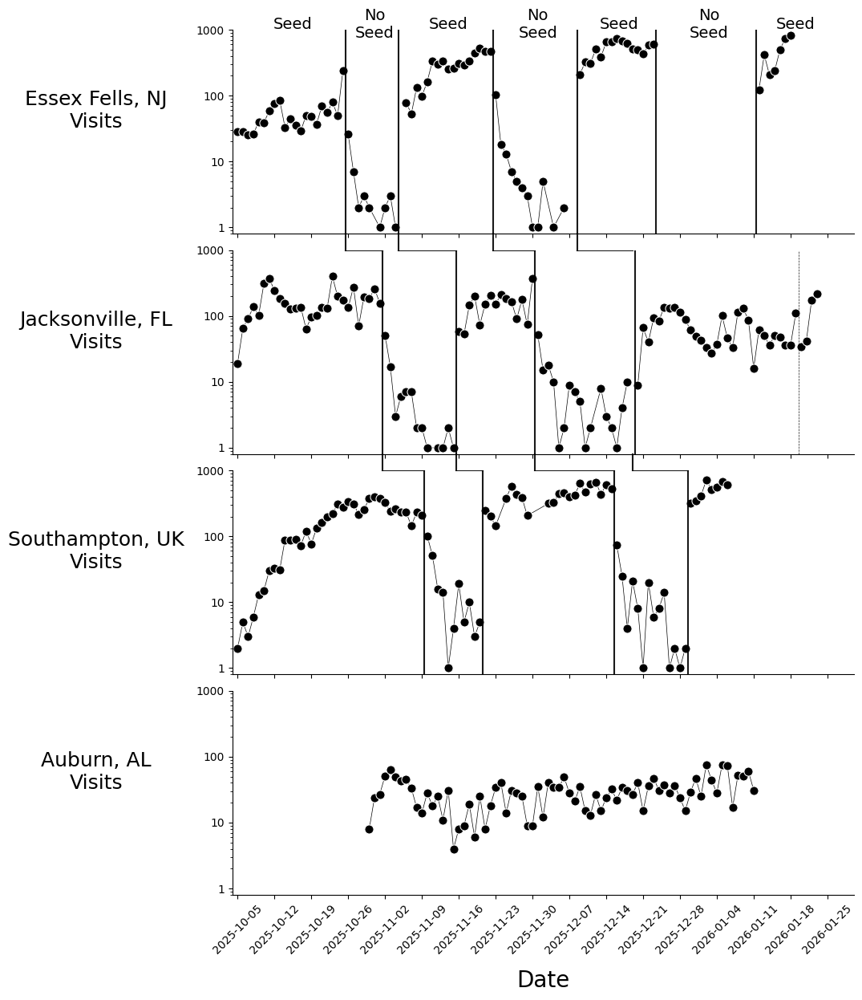

In [30]:
# ---------- Prep ----------
merged_data['Date_dt'] = pd.to_datetime(merged_data['Date_str'])
phase_changes['DateChangeStarted'] = pd.to_datetime(phase_changes['DateChangeStarted'])

regions_order = ['Essex Fells, NJ', 'Jacksonville, FL', 'Southampton, UK', 'Auburn, AL']

# Collect change rows per location
changes_by_loc = {
    loc: phase_changes[phase_changes['LocationOfChange'] == loc].copy().sort_values('DateChangeStarted')
    for loc in regions_order
}

def phase_midpoint(df_with_dt, change_dt):
    """
    Return the halfway datetime between the last point BEFORE change_dt and
    the first point AT/AFTER change_dt. Falls back sensibly if edges are missing.
    If change_dt is after all data points, return a date after the last data point.
    """
    dates = np.sort(df_with_dt['Date_dt'].dropna().unique())
    if dates.size == 0:
        return None
    left_candidates = dates[dates < change_dt]
    right_candidates = dates[dates >= change_dt]
    if left_candidates.size and right_candidates.size:
        # Normal case: change date is between data points
        left, right = left_candidates[-1], right_candidates[0]
        return left + (right - left) / 2
    elif right_candidates.size == 0:
        # Change date is after all data points - place line at the change date itself
        # This ensures the line appears to the right of the last data point
        return change_dt
    elif left_candidates.size == 0:
        # Change date is before all data points - place line at the change date itself
        return change_dt
    else:
        # Fallback: should not reach here, but handle gracefully
        if dates.size >= 2:
            left, right = dates[-2], dates[-1]
        else:
            left = right = dates[0]
        return left + (right - left) / 2

# Compute ALL phase midpoints per region (not just the first)
all_mids_by_region = {}
primary_mid_by_region = {}
for loc in regions_order:
    rdf = merged_data[merged_data['source_sheet'] == loc].sort_values('Date_dt')
    mids = []
    if not changes_by_loc[loc].empty:
        for _, change_row in changes_by_loc[loc].iterrows():
            mid = phase_midpoint(rdf, change_row['DateChangeStarted'])
            if mid is not None:
                mids.append(mid)
        all_mids_by_region[loc] = mids
        # Keep primary_mid for backward compatibility (first change)
        primary_mid_by_region[loc] = mids[0] if mids else None
    else:
        all_mids_by_region[loc] = []
        primary_mid_by_region[loc] = None

# ---------- Phase labels configuration ----------
phase_labels = {
    'Essex Fells, NJ': {'before': 'Seed', 'after': 'No\nSeed'},
    # 'Jacksonville, FL': {'before': 'Seed', 'after': 'No Seed'},
    # 'Southampton, UK': {'before': 'Seed', 'after': 'No Seed'},
}

# ---------- Calculate overall date range from entire dataset ----------
# Filter merged_data to get overall date range (applying same filter as regions)
merged_data_filtered = merged_data[merged_data['Date_dt'] >= pd.to_datetime('2025-10-05')]
overall_date_min = merged_data_filtered['Date_dt'].min() if not merged_data_filtered.empty else pd.to_datetime('2025-10-05')
overall_date_max = merged_data_filtered['Date_dt'].max() if not merged_data_filtered.empty else pd.to_datetime('2026-01-09')
overall_date_max_extended = overall_date_max + pd.Timedelta(days=7)

# ---------- Figure ----------
fig, axes = plt.subplots(
    nrows=4, ncols=1, figsize=(10, 14),
    sharex=True, gridspec_kw=dict(hspace=0.08)
)

for ax, region in zip(axes, regions_order):
    # Prepare region data (once per region)
    region_df = (
        merged_data[merged_data['source_sheet'] == region]
        .copy()
        .sort_values('Date_dt')
    )
    # Filter by date, but if that removes all data, use all available data
    region_df_filtered = region_df[region_df['Date_dt'] >= pd.to_datetime('2025-10-05')]
    if not region_df_filtered.empty:
        region_df = region_df_filtered
    
    # Get date range and change info
    date_min = region_df['Date_dt'].min()
    date_max = region_df['Date_dt'].max()
    
    # Fill in missing dates with 0 visits
    if not region_df.empty and pd.notna(date_min) and pd.notna(date_max):
        # Create complete date range
        complete_dates = pd.date_range(start=date_min, end=date_max, freq='D')
        
        # Create a template dataframe with all dates
        complete_df = pd.DataFrame({
            'Date_dt': complete_dates,
            'source_sheet': region
        })
        
        # Get all columns from region_df to preserve them
        other_columns = [col for col in region_df.columns 
                        if col not in ['Date_dt', 'source_sheet', 'Feeder Visits']]
        
        # Merge with existing data, filling missing dates with 0 for Feeder Visits
        region_df = complete_df.merge(
            region_df,
            on=['Date_dt', 'source_sheet'],
            how='left'
        )
        
        # Fill missing Feeder Visits with 0
        if 'Feeder Visits' in region_df.columns:
            region_df['Feeder Visits'] = region_df['Feeder Visits'].fillna(0)
        else:
            region_df['Feeder Visits'] = 0
        
        # Fill other numeric columns with 0, preserve non-numeric columns as-is
        for col in other_columns:
            if col in region_df.columns:
                if region_df[col].dtype in ['int64', 'float64', 'Int64', 'Float64']:
                    region_df[col] = region_df[col].fillna(0)
        
        # Sort by date
        region_df = region_df.sort_values('Date_dt').reset_index(drop=True)
    
    # Replace all 0 feeder visits with np.nan so it doesn't impact log scale 
    region_df['Feeder Visits'] = region_df['Feeder Visits'].replace(0, np.nan)
    all_changes = changes_by_loc[region]
    
    # Recompute phase midpoints using the filtered region_df (so they align with plotted data)
    all_mids = []
    if not all_changes.empty and not region_df.empty:
        for _, change_row in all_changes.iterrows():
            mid = phase_midpoint(region_df, change_row['DateChangeStarted'])
            if mid is not None:
                all_mids.append(mid)
    
    # Plot data (split at ALL phase changes if applicable)
    if not all_changes.empty:
        # Get all change dates sorted
        change_dates = sorted(all_changes['DateChangeStarted'].tolist())
        
        # Split data at each change point
        segments = []
        if len(change_dates) > 0:
            # First segment: before first change
            segments.append(region_df[region_df['Date_dt'] < change_dates[0]])
            # Middle segments: between changes
            for i in range(len(change_dates) - 1):
                segments.append(region_df[(region_df['Date_dt'] >= change_dates[i]) & 
                                          (region_df['Date_dt'] < change_dates[i+1])])
            # Last segment: after last change
            segments.append(region_df[region_df['Date_dt'] >= change_dates[-1]])
        else:
            segments = [region_df]
        
        # Plot each segment
        for seg_df in segments:
            if not seg_df.empty:
                sns.lineplot(
                    x='Date_dt', y='Feeder Visits', data=seg_df,
                    marker='o', markersize=8, color='black', ax=ax, legend=False, 
                    linewidth=0.5
                )
    else:
        # No phase change—plot as one segment
        sns.lineplot(
            x='Date_dt', y='Feeder Visits', data=region_df,
            marker='o', markersize=8, color='black', ax=ax, legend=False, 
            linewidth=0.5
        )

    # Draw vertical lines for ALL phase changes
    for idx, mid in enumerate(all_mids):
        if mid is not None:
            # Make last line dashed for Jacksonville, FL
            if region == 'Jacksonville, FL' and idx == len(all_mids) - 1:
                ax.axvline(mid, color='black', linewidth=0.5, alpha=0.9, linestyle='--')
            else:
                ax.axvline(mid, color='black', linewidth=1.5, alpha=0.9)
    
    # Phase labels (only if configured)
    if region in phase_labels:
        y_pos_log = 1200
        
        # Determine condition for each phase segment
        if not all_changes.empty:
            # Get baseline condition (before first change)
            baseline_condition = phase_labels[region].get('before', 'Seed')
            
            # Helper function to determine condition from description
            def to_condition(desc):
                desc_lower = str(desc).lower()
                if 'seed' in desc_lower and 'extinct' not in desc_lower:
                    return 'Seed'
                if 'extinct' in desc_lower or 'extinction' in desc_lower or 'no seed' in desc_lower:
                    return 'No\nSeed'
                return 'No\nSeed'
            
            # Track condition through each phase
            current_condition = baseline_condition
            change_dates = sorted(all_changes['DateChangeStarted'].tolist())
            
            # Create phase boundaries: [date_min, change1, change2, ..., date_max]
            phase_boundaries = [date_min] + change_dates + [date_max]
            
            # Label each phase segment
            for i in range(len(phase_boundaries) - 1):
                phase_start = phase_boundaries[i]
                phase_end = phase_boundaries[i + 1]
                
                # Determine condition for this phase
                if i == 0:
                    # First phase: use baseline
                    condition = baseline_condition
                elif i == len(phase_boundaries) - 2:
                    # Final phase: explicitly set to 'Seed'
                    condition = 'Seed'
                else:
                    # Subsequent phases: condition changes at each boundary
                    # Find the change that happened at phase_start
                    change_at_start = all_changes[all_changes['DateChangeStarted'] == phase_start]
                    if not change_at_start.empty:
                        current_condition = to_condition(change_at_start.iloc[0]['DescriptionOfChange'])
                    condition = current_condition
                
                # Center label in this phase segment
                if i == len(phase_boundaries) - 2:
                    # Final phase: isolate positioning code
                    x_center = phase_start + (phase_end - phase_start) / 2
                    ax.text(x_center+pd.Timedelta(days=4), y_pos_log, condition,
                           ha='center', va='center', fontsize=14)
                else:
                    # Other phases: standard positioning
                    x_center = phase_start + (phase_end - phase_start) / 2
                    ax.text(x_center, y_pos_log, condition,
                           ha='center', va='center', fontsize=14)
        else:
            # No phase change - single label
            x_center = date_min + (date_max - date_min) / 2
            ax.text(x_center, y_pos_log, phase_labels[region].get('before', ''),
                   ha='center', va='center', fontsize=14)

    # Panel cosmetics
    ax.set_ylabel(f'{region}\nVisits', fontsize=18, rotation=0, ha='center', labelpad=90)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_yscale('log')
    ax.set_ylim(0.8, 1000)
    
    # xlim and xticks will be set after the loop using overall dataset range

# Set xlim and xticks for all axes using overall dataset range
for ax in axes:
    ax.set_xlim(pd.to_datetime('2025-10-04'), overall_date_max_extended)
    ax.set_xticks(pd.date_range(start=overall_date_min, end=overall_date_max_extended, freq='W'))

# Format y-axis for all axes (moved outside the loop)
fmt = plt.matplotlib.ticker.FuncFormatter(lambda y, _: f'{int(y):d}' if y >= 1 else f'{y:g}')
for ax in axes:
    ax.yaxis.set_major_formatter(fmt)
    ax.yaxis.set_minor_formatter(plt.matplotlib.ticker.NullFormatter())

# ---------- Multi-baseline connectors ----------
def draw_connector(fig, axes, top_ax_idx, bottom_ax_idx, top_mid, bottom_mid, 
                   linewidth=1.5, alpha=0.9, color='black'):
    """
    Draw connectors between two panels: horizontal line on bottom panel and vertical line between panels.
    
    Parameters:
    - fig: matplotlib figure
    - axes: list of axes
    - top_ax_idx: index of top panel (0-based)
    - bottom_ax_idx: index of bottom panel (0-based)
    - top_mid: datetime of phase change in top panel
    - bottom_mid: datetime of phase change in bottom panel
    - linewidth: width of connector lines
    - alpha: transparency
    - color: line color
    """
    if top_mid is None or bottom_mid is None:
        return
    
    # Horizontal connector across the TOP of the BOTTOM panel
    x1, x2 = sorted([top_mid, bottom_mid])  # left->right
    axes[bottom_ax_idx].plot(
        [x1, x2], [1, 1],
        transform=axes[bottom_ax_idx].get_xaxis_transform(),  # y in axes coords (top edge)
        color=color, linewidth=linewidth, alpha=alpha
    )
    
    # Vertical connector from bottom of TOP panel down to TOP of BOTTOM panel
    # Convert x to figure coordinates so the line spans between axes
    ax_top = axes[top_ax_idx]
    xnum_top = ax_top.convert_xunits(top_mid)                    # convert datetime -> axis units
    x_disp = ax_top.transData.transform((xnum_top, 0))[0]       # display coords (pixels)
    x_fig = fig.transFigure.inverted().transform((x_disp, 0))[0]  # figure fraction (0..1)
    
    top_bbox = axes[top_ax_idx].get_position()   # in figure fraction
    bottom_bbox = axes[bottom_ax_idx].get_position()
    
    # Draw vertical segment strictly between the panels
    fig.lines.append(
        Line2D([x_fig, x_fig], [bottom_bbox.y1, top_bbox.y0],
               transform=fig.transFigure, color=color, linewidth=linewidth, alpha=alpha)
    )

# Define connector configurations: (top_ax_idx, bottom_ax_idx, top_region, bottom_region, phase_idx)
connector_configs = [
    (0, 1, 'Essex Fells, NJ', 'Jacksonville, FL', 0),  # First phase: top to middle
    (0, 1, 'Essex Fells, NJ', 'Jacksonville, FL', 1),  # Second phase: top to middle
    (0, 1, 'Essex Fells, NJ', 'Jacksonville, FL', 2),  # Third phase: top to middle
    (0, 1, 'Essex Fells, NJ', 'Jacksonville, FL', 3),  # Fourth phase: top to middle
    (1, 2, 'Jacksonville, FL', 'Southampton, UK', 0),  # First phase: middle to third
    (1, 2, 'Jacksonville, FL', 'Southampton, UK', 1),  # Second phase: middle to third
    (1, 2, 'Jacksonville, FL', 'Southampton, UK', 2),  # Third phase: middle to third
    (1, 2, 'Jacksonville, FL', 'Southampton, UK', 3),  # Fourth phase: middle to third
]

for top_idx, bottom_idx, top_region, bottom_region, phase_idx in connector_configs:
    # Get midpoints for this phase
    top_mids = all_mids_by_region.get(top_region, [])
    bottom_mids = all_mids_by_region.get(bottom_region, [])
    
    # Get midpoint for this phase from all_mids (consistent indexing)
    top_mid = top_mids[phase_idx] if len(top_mids) > phase_idx else None
    bottom_mid = bottom_mids[phase_idx] if len(bottom_mids) > phase_idx else None
    
    draw_connector(fig, axes, top_idx, bottom_idx, top_mid, bottom_mid)

# Bottom x-axis formatting
axes[-1].set_xlabel('Date', fontsize=20, labelpad=12)
for ax in axes:
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.subplots_adjust(wspace=0.8)
plt.show()

In [31]:
# Save migration correlation plot for dashboard
save_plot_for_dashboard(
    fig, 
    'mbd_plot', 
    'Multiple Baseline of Feeder Visits',
    'Multiple Baseline of feeder visits across three sites'
)

Saved: Multiple Baseline of Feeder Visits -> mbd_plot


'mbd_plot'

## Calculating Daily and Weekly Diversity

In [32]:
def calculate_species_richness_by_region(daily_summs_df):
    """
    Calculate species richness (number of unique species) per day per region.
    
    Parameters:
    daily_summs_df: DataFrame with columns ['Date', 'Bird', 'Feeder Visits', 'source_sheet', ...]
    
    Returns:
    DataFrame with Date, source_sheet, and richness columns
    """
    daily = daily_summs_df.copy()
    daily['Date'] = pd.to_datetime(daily['Date'])
    
    daily = daily[daily['Feeder Visits'] > 0].reset_index(drop=True)
    richness = daily.groupby(["Date", "source_sheet"])["Bird"].nunique().reset_index()
    richness.columns = ['Date', 'source_sheet', 'richness']
    
    return richness

def calculate_shannon_h_by_region(daily_summs_df):
    """
    Calculate Shannon H (alpha diversity) per day per region.
    
    Parameters:
    daily_summs_df: DataFrame with columns ['Date', 'Bird', 'Feeder Visits', 'source_sheet', ...]
    
    Returns:
    DataFrame with Date, source_sheet, and shannon_H columns
    """
    daily = daily_summs_df.copy()
    daily['Date'] = pd.to_datetime(daily['Date'])
    
    # Create pivot table: dates and regions as rows, bird species as columns, feeder visits as values
    day_species = daily.pivot_table(
        index=["Date", "source_sheet"], 
        columns="Bird", 
        values="Feeder Visits", 
        aggfunc="sum", 
        fill_value=0
    )
    
    # Calculate proportions (relative abundance) for each species on each day/region
    # Replace 0 with NaN to avoid log(0) issues
    p = day_species.div(day_species.sum(axis=1), axis=0).replace(0, np.nan)
    
    # Calculate Shannon H: -sum(p * log(p))
    shannon = (-(p * np.log(p)).sum(axis=1)).reset_index()
    shannon.columns = ['Date', 'source_sheet', 'shannon_H']
    
    return shannon

def calculate_u_value_by_region(daily_summs_df):
    """
    Calculate U-value (evenness metric) per day per region.
    
    U-value = - Σ (from i=1 to β) [ (α_i × log(α_i)) / log(β) ]
    where β = total number of unique species seen to date (cumulative)
    and α_i = relative frequency of species i on that day.
    
    Parameters:
    daily_summs_df: DataFrame with columns ['Date', 'Bird', 'Feeder Visits', 'source_sheet', ...]
    
    Returns:
    DataFrame with Date, source_sheet, and u_value columns
    """
    daily = daily_summs_df.copy()
    daily['Date'] = pd.to_datetime(daily['Date'])
    
    # Filter to only observations with feeder visits > 0
    daily = daily[daily['Feeder Visits'] > 0].reset_index(drop=True)
    
    u_values = []
    
    # Process each location separately
    for location in daily['source_sheet'].unique():
        location_data = daily[daily['source_sheet'] == location].copy()
        location_data = location_data.sort_values('Date')
        
        # Track cumulative unique species seen up to each date
        cumulative_species = set()
        
        # Process each date in chronological order
        for date in sorted(location_data['Date'].unique()):
            date_data = location_data[location_data['Date'] == date]
            
            # Add species seen on this date to cumulative set
            species_on_date = set(date_data['Bird'].unique())
            cumulative_species.update(species_on_date)
            
            # β = total number of unique species seen to date
            beta = len(cumulative_species)
            
            if beta == 0:
                u_values.append({'Date': date, 'source_sheet': location, 'u_value': np.nan})
                continue
            
            # Create pivot table for this date: species as columns, feeder visits as values
            day_species = date_data.pivot_table(
                index="Date",
                columns="Bird",
                values="Feeder Visits",
                aggfunc="sum",
                fill_value=0
            )
            
            # Calculate proportions (relative abundance) for each species on this day
            # α_i = relative frequency of species i
            total_visits = day_species.sum(axis=1).iloc[0]
            if total_visits == 0:
                u_values.append({'Date': date, 'source_sheet': location, 'u_value': np.nan})
                continue
            
            alpha = day_species.iloc[0] / total_visits
            
            # Calculate U-value: - Σ [ (α_i × log(α_i)) / log(β) ]
            # Only include species that were actually observed on this day (alpha > 0)
            observed_species = alpha[alpha > 0]
            if len(observed_species) == 0:
                u_values.append({'Date': date, 'source_sheet': location, 'u_value': np.nan})
                continue
            
            u_value = -((observed_species * np.log(observed_species)) / np.log(beta)).sum()
            u_values.append({'Date': date, 'source_sheet': location, 'u_value': u_value})
    
    u_value_df = pd.DataFrame(u_values)
    u_value_df['Date'] = pd.to_datetime(u_value_df['Date'])
    
    return u_value_df

def calculate_weekly_sorensen_dissimilarity_by_region(daily_summs_df):
    """
    Calculate Sørensen dissimilarity between consecutive weeks per region.
    
    Parameters:
    daily_summs_df: DataFrame with columns ['Date', 'Bird', 'Feeder Visits', 'source_sheet', ...]
    
    Returns:
    DataFrame with Date, source_sheet, and sorensen_dissimilarity columns
    """
    daily = daily_summs_df.copy()
    daily = daily.dropna().reset_index(drop=True)
    daily['Date'] = pd.to_datetime(daily['Date'])
    daily['week'] = daily['Date'].dt.isocalendar().week
    
    # Create weekly presence/absence matrix per region
    weekly_presence = (daily.groupby(["week", "source_sheet", "Bird"])["Feeder Visits"]
                       .sum().unstack(fill_value=0) > 0).astype(int)
    
    # Calculate Sørensen dissimilarity between consecutive weeks for each region
    sorensen = []
    
    for region in daily['source_sheet'].unique():
        region_data = daily[daily['source_sheet'] == region]
        region_weeks = sorted(region_data['week'].unique())
        
        for w_prev, w_curr in zip(region_weeks[:-1], region_weeks[1:]):
            try:
                a = weekly_presence.loc[(w_prev, region)]  # Previous week species presence
                b = weekly_presence.loc[(w_curr, region)]  # Current week species presence
                
                a_sum = a.sum()  # Number of species in previous week
                b_sum = b.sum()  # Number of species in current week
                intersection = (a & b).sum()  # Number of species in both weeks
                
                # Sørensen dissimilarity formula: 1 - (2 * intersection) / (a_sum + b_sum)
                denom = (a_sum + b_sum)
                d_s = np.nan if denom == 0 else 1 - (2 * intersection / denom)
                
                sorensen.append({
                    "week": w_curr, 
                    "source_sheet": region,
                    "sorensen_dissimilarity": d_s
                })
            except KeyError:
                continue
    
    # Convert to DataFrame
    beta_df = pd.DataFrame(sorensen)
    
    # Get all dates and their weeks per region
    all_dates = daily[['Date', 'week', 'source_sheet']].drop_duplicates().sort_values(['source_sheet', 'Date'])
    
    # Merge with Sørensen dissimilarity data
    result_df = all_dates.merge(beta_df, on=['week', 'source_sheet'], how='left')
    result_df = result_df[['Date', 'source_sheet', 'sorensen_dissimilarity']]
    
    return result_df

def calculate_rolling_sorensen_dissimilarity_by_region(daily_summs_df):
    """
    Calculate Sørensen dissimilarity using rolling 3-day comparisons per region.
    
    Parameters:
    daily_summs_df: DataFrame with columns ['Date', 'Bird', 'Feeder Visits', 'source_sheet', ...]
    
    Returns:
    DataFrame with Date, source_sheet, and rolling_sorensen_dissimilarity columns
    """
    daily = daily_summs_df.copy()
    daily['Date'] = pd.to_datetime(daily['Date'])
    
    sorensen_results = []
    
    # Process each region separately
    for region in daily['source_sheet'].unique():
        region_data = daily[daily['source_sheet'] == region].sort_values('Date').reset_index(drop=True)
        region_data['source_sheet'] = region_data['source_sheet'].fillna(region)
        
        # Create daily presence/absence matrix for this region
        daily_presence = (region_data.groupby(["Date", "Bird"])["Feeder Visits"]
                          .sum().unstack(fill_value=0) > 0).astype(int)
        
        # Get sorted dates for this region
        dates_sorted = sorted(daily_presence.index)
        
        # Calculate rolling 3-day Sørensen dissimilarity
        for i in range(len(dates_sorted)):
            current_date = dates_sorted[i]
            
            # Define the two 3-day periods to compare
            period_a_dates = []
            period_b_dates = []
            
            # Get dates for period A (7-9 days ago)
            for offset in [9, 8, 7]:
                if i - offset >= 0:
                    period_a_dates.append(dates_sorted[i - offset])
            
            # Get dates for period B (0-2 days ago)
            for offset in [2, 1, 0]:
                if i - offset >= 0:
                    period_b_dates.append(dates_sorted[i - offset])
            
            # Only calculate if we have at least one date in each period
            if len(period_a_dates) > 0 and len(period_b_dates) > 0:
                # Get species presence for each period
                period_a_presence = daily_presence.loc[period_a_dates].any(axis=0)
                period_b_presence = daily_presence.loc[period_b_dates].any(axis=0)
                
                # Calculate Sørensen dissimilarity
                a_sum = period_a_presence.sum()
                b_sum = period_b_presence.sum()
                intersection = (period_a_presence & period_b_presence).sum()
                
                # Sørensen dissimilarity formula: 1 - (2 * intersection) / (a_sum + b_sum)
                denom = (a_sum + b_sum)
                d_s = np.nan if denom == 0 else 1 - (2 * intersection / denom)
                
                sorensen_results.append({
                    'Date': current_date,
                    'source_sheet': region,
                    'rolling_sorensen_dissimilarity': d_s
                })
            else:
                sorensen_results.append({
                    'Date': current_date,
                    'source_sheet': region,
                    'rolling_sorensen_dissimilarity': np.nan
                })
    
    # Create result DataFrame
    result_df = pd.DataFrame(sorensen_results)
    
    return result_df

# Calculate each metric separately
richness_df = calculate_species_richness_by_region(daily_summs)
shannon_df = calculate_shannon_h_by_region(daily_summs)
u_value_df = calculate_u_value_by_region(daily_summs)
weekly_sorensen_df = calculate_weekly_sorensen_dissimilarity_by_region(daily_summs)
rolling_sorensen_df = calculate_rolling_sorensen_dissimilarity_by_region(daily_summs)

# Merge all metrics into a single dataframe
diversity_metrics_clean = richness_df.merge(shannon_df, on=['Date', 'source_sheet'], how='outer')
diversity_metrics_clean = diversity_metrics_clean.merge(u_value_df, on=['Date', 'source_sheet'], how='outer')
diversity_metrics_clean = diversity_metrics_clean.merge(weekly_sorensen_df, on=['Date', 'source_sheet'], how='outer')
diversity_metrics_clean = diversity_metrics_clean.merge(rolling_sorensen_df, on=['Date', 'source_sheet'], how='outer')

# Sort by date and region
diversity_metrics_clean = diversity_metrics_clean.sort_values(['source_sheet', 'Date']).reset_index(drop=True)

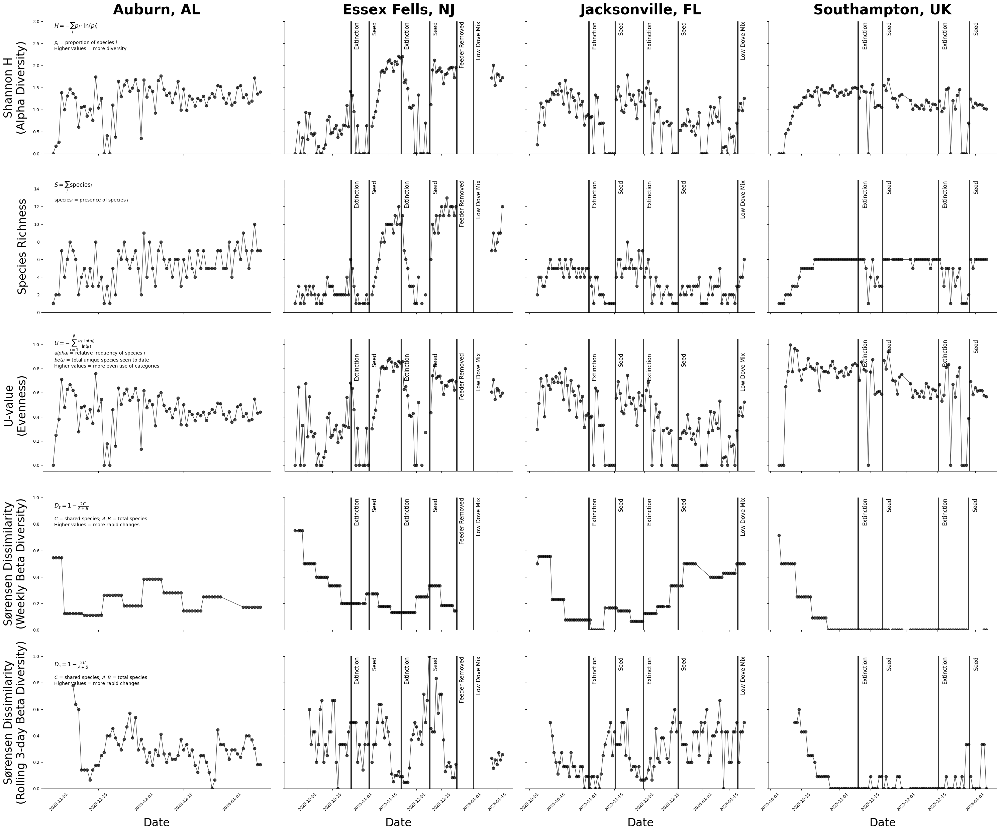

In [33]:
# Get unique locations
locations = sorted(diversity_metrics_clean['source_sheet'].unique())
n_locations = len(locations)

# Create 4x3 subplot layout (4 rows for metrics, 3 columns for locations)
fig, axes = plt.subplots(5, n_locations, figsize=(7.5*n_locations, 25), sharex='col', sharey='row')

# Ensure axes is always a 2D array for consistent indexing
if n_locations == 1:
    axes = axes.reshape(5, 1)

# Define plot configurations (one per metric/row)
plot_configs = [
    {
        'row_idx': 0,
        'y_col': 'shannon_H',
        'title': 'Species Diversity Within Each Day',
        'ylabel': 'Shannon H\n(Alpha Diversity)',
        'show_legend': True,
        'equation': r'$H = -\sum_{i} p_i \cdot \ln(p_i)$',
        'description': '$p_i$ = proportion of species $i$\nHigher values = more diversity',
        'eq_pos': (0.05, 0.90),
        'desc_pos': (0.05, 0.775),
        'eq_align': 'left', 
        'ylim': (0, 3)
    },
    {
        'row_idx': 1,
        'y_col': 'richness',
        'title': 'Number of Unique Species Per Day',
        'ylabel': 'Species Richness',
        'show_legend': False,
        'equation': r'$S = \sum_{i} \text{species}_i$',
        'description': r'$\text{species}_i$ = presence of species $i$',
        'eq_pos': (0.05, 0.9),
        'desc_pos': (0.05, 0.825),
        'eq_align': 'left', 
        'ylim': (0, 15)
    },
        {
        'row_idx': 2,
        'y_col': 'u_value',
        'title': 'Species Evenness (U-value)',
        'ylabel': 'U-value\n(Evenness)',
        'show_legend': False,
        'equation': r'$U = -\sum_{i=1}^{\beta} \frac{\alpha_i \cdot \ln(\alpha_i)}{\ln(\beta)}$',
        'description': '$alpha_i$ = relative frequency of species $i$' + '\n' + '$beta$ = total unique species seen to date' + '\n' + 'Higher values = more even use of categories',
        'eq_pos': (0.05, 0.9),
        'desc_pos': (0.05, 0.775),
        'eq_align': 'left',
        'ylim': None  # Let it auto-scale
    },
    {
        'row_idx': 3,
        'y_col': 'sorensen_dissimilarity',
        'title': 'Species Turnover Between Weeks',
        'ylabel': 'Sørensen Dissimilarity\n(Weekly Beta Diversity)',
        'show_legend': False,
        'equation': r'$D_s = 1 - \frac{2C}{A + B}$',
        'description': '$C$ = shared species; $A,B$ = total species\nHigher values = more rapid changes',
        'eq_pos': (0.05, 0.9),
        'desc_pos': (0.05, 0.775),
        'eq_align': 'left',
        'ylim': (0, 1),
        'data_filter': lambda df: df.dropna(subset=['sorensen_dissimilarity'])
    },
    {
        'row_idx': 4,
        'y_col': 'rolling_sorensen_dissimilarity',
        'title': 'Species Turnover (Rolling 3-day)',
        'ylabel': 'Sørensen Dissimilarity\n(Rolling 3-day Beta Diversity)',
        'show_legend': False,
        'equation': r'$D_s = 1 - \frac{2C}{A + B}$',
        'description': '$C$ = shared species; $A,B$ = total species\nHigher values = more rapid changes',
        'eq_pos': (0.05, 0.9),
        'desc_pos': (0.05, 0.775),
        'eq_align': 'left',
        'ylim': (0, 1),
        'data_filter': lambda df: df.dropna(subset=['rolling_sorensen_dissimilarity'])
    }
]

# Plot all subplots: iterate over metrics (rows) and locations (columns)
for config in plot_configs:
    row_idx = config['row_idx']
    
    # Filter data if needed (for the entire metric)
    plot_data = config.get('data_filter', lambda df: df)(diversity_metrics_clean)
    
    for col_idx, location in enumerate(locations):
        ax = axes[row_idx, col_idx]
        
        # Get data for this location and metric
        location_data = plot_data[plot_data['source_sheet'] == location].copy()
        
                # Check for phase changes for this location
        location_phase_changes = phase_changes[phase_changes['LocationOfChange'] == location]
        
        # Get all phase change dates if they exist
        phase_change_dates = []
        if not location_phase_changes.empty:
            phase_change_dates = sorted([pd.to_datetime(row['DateChangeStarted']) 
                                       for _, row in location_phase_changes.iterrows()])
        
        if not location_data.empty and location_data[config['y_col']].notna().any():
            # Ensure Date is datetime
            location_data['Date'] = pd.to_datetime(location_data['Date'])
            location_data = location_data.sort_values('Date')
            
            # Split data at all phase changes if they exist
            if phase_change_dates:
                # Create segments: before first change, between changes, after last change
                segments = []
                
                # Data before first phase change
                before_first = location_data[location_data['Date'] < phase_change_dates[0]]
                if not before_first.empty:
                    segments.append(before_first)
                
                # Data between phase changes
                for i in range(len(phase_change_dates) - 1):
                    between = location_data[
                        (location_data['Date'] >= phase_change_dates[i]) & 
                        (location_data['Date'] < phase_change_dates[i + 1])
                    ]
                    if not between.empty:
                        segments.append(between)
                
                # Data after last phase change
                after_last = location_data[location_data['Date'] >= phase_change_dates[-1]]
                if not after_last.empty:
                    segments.append(after_last)
                
                # Plot each segment separately
                for segment in segments:
                    if not segment.empty and segment[config['y_col']].notna().any():
                        ax.plot(
                            segment['Date'], 
                            segment[config['y_col']], 
                            marker='o', 
                            markersize=6,
                            linewidth=1, 
                            alpha=0.7,
                            color='black',
                            label=location if row_idx == 0 and col_idx == 0 and config['show_legend'] else ""
                        )
            else:
                # No phase change, plot normally
                ax.plot(
                    location_data['Date'], 
                    location_data[config['y_col']], 
                    marker='o', 
                    markersize=6,
                    linewidth=1, 
                    alpha=0.7,
                    color='black',
                    label=location if row_idx == 0 and col_idx == 0 and config['show_legend'] else ""
                )
            
            # Add phase change vertical lines for this location
            for _, phase_row in location_phase_changes.iterrows():
                change_date = pd.to_datetime(phase_row['DateChangeStarted'])
                description = phase_row['DescriptionOfChange']
                
                # Find the date before the change date
                location_dates = location_data['Date'].unique()
                location_dates = pd.to_datetime(location_dates)
                location_dates = np.sort(location_dates)
                
                # Find the date before the change date
                before_change_idx = np.where(location_dates < change_date)[0]
                if len(before_change_idx) > 0:
                    date_before = location_dates[before_change_idx[-1]]
                    # Calculate halfway point
                    halfway_date = date_before + (change_date - date_before) / 2
                    
                    # Add vertical line
                    ax.axvline(x=halfway_date, color='black', linestyle='-', linewidth=3, alpha=0.8)
                    
                    # Add description text
                    ymax = location_data[config['y_col']].max()
                    if 'ylim' in config and config['ylim'] is not None:
                        ylim_max = config['ylim'][1]
                    else:
                        ylim_max = ax.get_ylim()[1]
                    ax.text(halfway_date + pd.Timedelta(days=3), ylim_max, description, 
                        rotation=90, ha='center', va='top', fontsize=12)
            
            # Set labels
            if col_idx == 0:
                ax.set_ylabel(config['ylabel'], fontsize=24, labelpad=12)
            else:
                ax.set_ylabel('')
            
            if row_idx == len(plot_configs) - 1:
                ax.set_xlabel('Date', fontsize=24, labelpad=12)
            else:
                ax.set_xlabel('')
            
            # Set title
            if row_idx == 0:
                # Top row: location names as column headers
                ax.set_title(location, fontsize=30, fontweight='bold', pad=15)
            # elif col_idx == 0:
            #     # First column: metric titles as row labels
            #     ax.set_title(config['title'], fontsize=12, fontweight='bold', pad=15)
            else:
                ax.set_title('')
            
            # Set y-axis limits if specified
            if 'ylim' in config and config['ylim'] is not None:
                ax.set_ylim(config['ylim'])
            
            # Remove legend
            # ax.legend().remove()
            
            # Add equation and description (only for first column)
            if col_idx == 0:
                ax.text(config['eq_pos'][0], config['eq_pos'][1], config['equation'], 
                       transform=ax.transAxes, fontsize=12, 
                       ha=config['eq_align'], va='bottom')
                ax.text(config['desc_pos'][0], config['desc_pos'][1], config['description'], 
                       transform=ax.transAxes, fontsize=10, 
                       ha=config['eq_align'], va='bottom')
        else:
            # Show "no data" message
            ax.text(0.5, 0.5, f'No {config["y_col"]} data available', 
                   ha='center', va='center', transform=ax.transAxes, fontsize=12)
            # Set title
            if row_idx == 0:
                ax.set_title(location, fontsize=12, fontweight='bold', pad=15)
            # elif col_idx == 0:
            #     ax.set_title(config['title'], fontsize=12, fontweight='bold', pad=15)
            else:
                ax.set_title('')
        
        # Apply styling
        sns.despine(top=True, right=True, ax=ax)
        ax.tick_params(axis='x', rotation=45, labelsize=9)
        ax.tick_params(axis='y', labelsize=9)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
plt.show()

In [34]:
# Save diversity metrics plot for dashboard
save_plot_for_dashboard(
    fig, 
    'diversity_metrics', 
    'Ecological Diversity Metrics',
    'Shannon H diversity and species richness metrics over time'
)

Saved: Ecological Diversity Metrics -> diversity_metrics


'diversity_metrics'

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/506991539.py:155: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/506991539.py:155: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/506991539.py:155: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend().remove()
/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/506991539.py:155: UserWarning: No artists with labels found to put in legend.  Note that artists whose labe

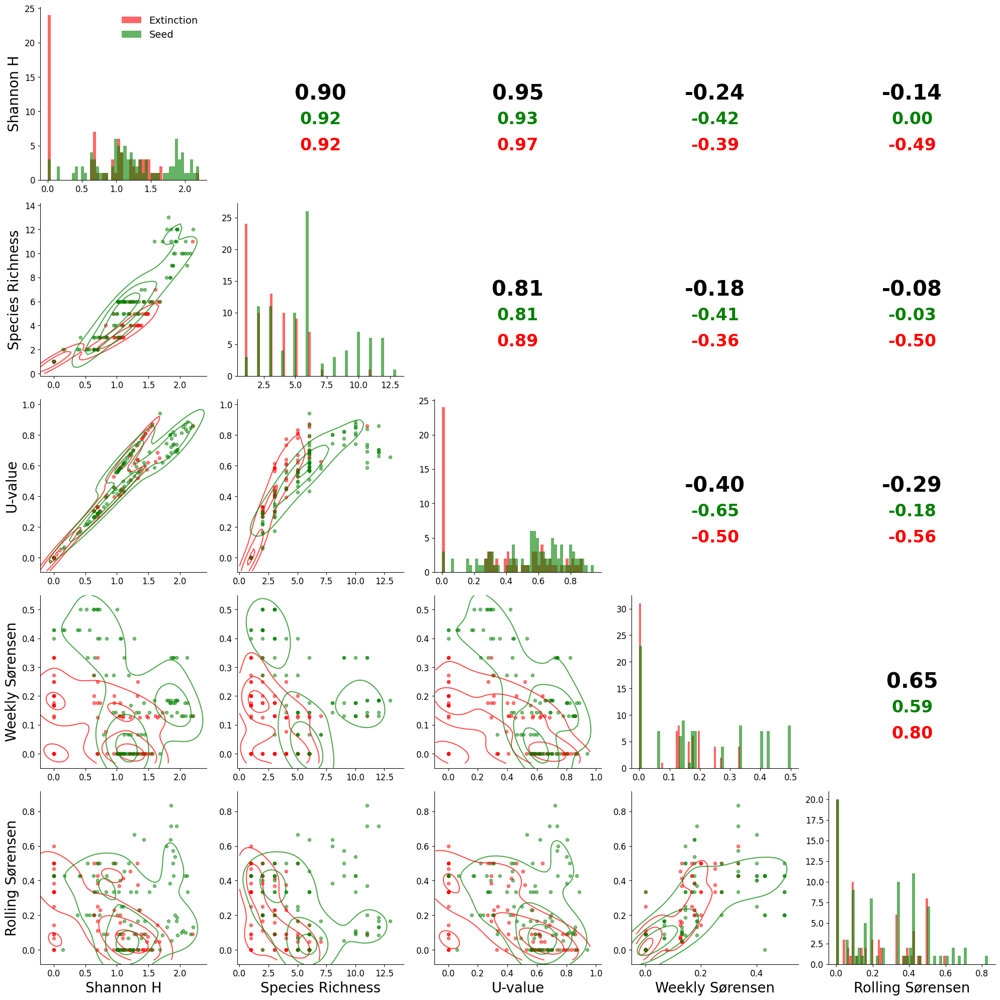

In [35]:
# Correlation matrix crossing dicversity measures
# Prepare data for correlation matrix
# First, merge diversity metrics with phase changes to get condition labels
correlation_data = diversity_metrics_clean.copy()

# Create condition column based on phase changes
correlation_data['condition'] = 'None'
correlation_data['Date'] = pd.to_datetime(correlation_data['Date'])

# For each location, label dates based on phase changes
for location in correlation_data['source_sheet'].unique():
    location_mask = correlation_data['source_sheet'] == location
    location_phase_changes = phase_changes[phase_changes['LocationOfChange'] == location].copy()
    
    if not location_phase_changes.empty:
        location_phase_changes['DateChangeStarted'] = pd.to_datetime(location_phase_changes['DateChangeStarted'])
        
        # Sort phase changes by date
        location_phase_changes = location_phase_changes.sort_values('DateChangeStarted')
        
        # Label each date based on the most recent phase change
        for idx, row in correlation_data[location_mask].iterrows():
            date = row['Date']
            # Find the most recent phase change before or on this date
            recent_changes = location_phase_changes[location_phase_changes['DateChangeStarted'] <= date]
            
            if not recent_changes.empty:
                # Get the most recent change
                most_recent = recent_changes.iloc[-1]
                description = most_recent['DescriptionOfChange'].lower()
                
                # Classify condition
                if 'extinction' in description:
                    correlation_data.loc[idx, 'condition'] = 'Extinction'
                elif 'seed' in description:
                    correlation_data.loc[idx, 'condition'] = 'Seed'
                elif 'feeder' in description and 'remove' in description:
                    correlation_data.loc[idx, 'condition'] = 'Feeder Removed'

# Select metrics for correlation matrix
metrics = ['shannon_H', 'richness', 'u_value', 'sorensen_dissimilarity', 'rolling_sorensen_dissimilarity']
metric_labels = ['Shannon H', 'Species Richness', 'U-value', 'Weekly Sørensen', 'Rolling Sørensen']

# Remove rows with any NaN values in the metrics
correlation_data_clean = correlation_data[metrics + ['condition', 'source_sheet']].dropna(subset=metrics)
correlation_data_clean = correlation_data_clean[correlation_data_clean['condition'] != 'None'].reset_index(drop=True)

# Create color mapping for conditions
condition_colors = {
    'None': 'gray',
    'Extinction': 'red',
    'Seed': 'green',
    'Feeder Removed': 'orange'
}

# Create the correlation matrix plot
n_metrics = len(metrics)
fig, axes = plt.subplots(n_metrics, n_metrics, figsize=(4*n_metrics, 4*n_metrics))

# Calculate correlation matrix for upper triangle
corr_matrix = correlation_data_clean[metrics].corr()

for i in range(n_metrics):
    for j in range(n_metrics):
        ax = axes[i, j]
        
        if i == j:
            # Diagonal: histograms separated by condition
            metric = metrics[i]
            data = correlation_data_clean[[metric, 'condition']].dropna()
            
            # Get unique conditions present in data
            conditions = data['condition'].unique()
            
            # Create histogram for each condition
            for cond in conditions:
                cond_data = data[data['condition'] == cond][metric]
                if len(cond_data) > 0:
                    ax.hist(cond_data, alpha=0.6, label=cond, 
                           color=condition_colors.get(cond, 'blue'), bins=50)
            
            # Only show xlabel on bottom row
            if i == n_metrics - 1:
                ax.set_xlabel(metric_labels[i], fontsize=20)
            else:
                ax.set_xlabel('')
            
            # Only show ylabel on left column
            if j == 0:
                ax.set_ylabel(metric_labels[i], fontsize=20)
            else:
                ax.set_ylabel('')
            
            if i == 0 and j == 0:
                ax.legend(fontsize=14, loc='upper right', frameon=False)
            else:
                ax.legend().remove()
            ax.tick_params(labelsize=12)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
        elif i > j:
            # Lower triangle: scatterplots colored by condition
            x_metric = metrics[j]
            y_metric = metrics[i]
            
            # Plot each condition separately to get proper colors
            for cond in correlation_data_clean['condition'].unique():
                cond_data = correlation_data_clean[correlation_data_clean['condition'] == cond]
                if len(cond_data) > 0:
                    # Scatter plot
                    ax.scatter(cond_data[x_metric], cond_data[y_metric], 
                             alpha=0.5, s=20, 
                             color=condition_colors.get(cond, 'blue'),
                             label='')
                    
                    # KDE contour lines
                    if len(cond_data) > 1:  # Need at least 2 points for KDE
                        try:
                            from scipy.stats import gaussian_kde
                            kde_data = cond_data[[x_metric, y_metric]].dropna()
                            if len(kde_data) > 1:
                                kde = gaussian_kde(kde_data.T)
                                x_min, x_max = cond_data[x_metric].min(), cond_data[x_metric].max()
                                y_min, y_max = cond_data[y_metric].min(), cond_data[y_metric].max()
                                x_range = x_max - x_min
                                y_range = y_max - y_min
                                
                                # Create grid for contour
                                xx = np.linspace(x_min - 0.1*x_range, x_max + 0.1*x_range, 50)
                                yy = np.linspace(y_min - 0.1*y_range, y_max + 0.1*y_range, 50)
                                XX, YY = np.meshgrid(xx, yy)
                                positions = np.vstack([XX.ravel(), YY.ravel()])
                                Z = kde(positions).reshape(XX.shape)
                                
                                # Plot contour lines only
                                ax.contour(XX, YY, Z, levels=3, colors=condition_colors.get(cond, 'blue'), 
                                         linewidths=1.5, alpha=0.7)
                        except:
                            pass  # Skip KDE if it fails
            
            # Only show xlabel on bottom row
            if i == n_metrics - 1:
                ax.set_xlabel(metric_labels[j], fontsize=20)
            else:
                ax.set_xlabel('')
            
            # Only show ylabel on left column
            if j == 0:
                ax.set_ylabel(metric_labels[i], fontsize=20)
            else:
                ax.set_ylabel('')
            
            ax.tick_params(labelsize=12)
            ax.legend().remove()
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
        else:
            # Upper triangle: correlation coefficient
            corr_value = corr_matrix.loc[metrics[i], metrics[j]]
            
            # Calculate correlations for Seed and Extinction conditions
            x_metric = metrics[j]
            y_metric = metrics[i]
            
            # Seed condition correlation
            seed_data = correlation_data_clean[correlation_data_clean['condition'] == 'Seed'][[x_metric, y_metric]].dropna()
            seed_corr = seed_data[x_metric].corr(seed_data[y_metric]) if len(seed_data) > 1 else np.nan
            
            # Extinction condition correlation
            extinction_data = correlation_data_clean[correlation_data_clean['condition'] == 'Extinction'][[x_metric, y_metric]].dropna()
            extinction_corr = extinction_data[x_metric].corr(extinction_data[y_metric]) if len(extinction_data) > 1 else np.nan
            
            # Clear the axis and add text
            ax.clear()
            # Overall correlation (black/default color)
            ax.text(0.5, 0.5, f'{corr_value:.2f}', 
                   ha='center', va='center', fontsize=30, fontweight='bold',
                   transform=ax.transAxes)
            # Seed correlation (green)
            # Extinction correlation (red)
            if not np.isnan(extinction_corr):
                ax.text(0.5, 0.2, f'{extinction_corr:.2f}', 
                       ha='center', va='center', fontsize=24, fontweight='bold',
                       color='red', transform=ax.transAxes)
            if not np.isnan(seed_corr):
                ax.text(0.5, 0.35, f'{seed_corr:.2f}', 
                       ha='center', va='center', fontsize=24, fontweight='bold',
                       color='green', transform=ax.transAxes)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
            ax.spines['left'].set_visible(False)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.tight_layout()
plt.show()

In [36]:
# Save correlation metrics for dashboard
save_plot_for_dashboard(
    fig, 
    'diversity_metrics_corr_matrix', 
    'Correlation Matrix of Diversity Metrics',
    'Correlation matrix crossing diversity measures'
)

Saved: Correlation Matrix of Diversity Metrics -> diversity_metrics_corr_matrix


'diversity_metrics_corr_matrix'

## Bring in PUC Data

In [ ]:
# Read in the study site data
study_site_data = pd.read_csv('../data/study_site_puc_data.csv')

# Site Dict
site_dict = {
    'Essex Fells, NJ_JCV': 'Essex Fells',
    'PUC-21974-COX': 'Jacksonville'
}
study_site_data['station_name'] = study_site_data['station_name'].map(site_dict)

# Make sure data are in the right format
study_site_data['date'] = pd.to_datetime(study_site_data['timestamp'])
study_site_data['date'] = study_site_data['date'].astype(str)
study_site_data['date'] = [val.split(' ')[0] for val in study_site_data['date']]
study_site_data['date'] = pd.to_datetime(study_site_data['date'])

# Remove today's data because incomplete
today = datetime.now().strftime('%Y-%m-%d')
study_site_data = study_site_data[study_site_data['date'] != today]

# Create only high probability and confidence data
prob_threshold = 0.7
conf_threshold = 0.7
high_prob_conf_df = study_site_data[(study_site_data['confidence'] > conf_threshold) & (study_site_data['probability'] > prob_threshold)].reset_index(drop=True)
high_prob_conf_df = high_prob_conf_df[['id', 'species_common', 'confidence', 'probability', 'station_name', 'timestamp', 'date']]

/var/folders/c5/vpx80swj4yb9ytlnrk8w2qnr0000gn/T/ipykernel_74575/3391546323.py:12: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  study_site_data['date'] = pd.to_datetime(study_site_data['timestamp'])


In [51]:
# Get counts of sounds by date
count_by_date_all = study_site_data.groupby(['date', 'station_name']).agg(
    count = ('id', 'count'), 
    probability = ('probability', 'sum'),   # Historical likelihood of seeing a particular species in this location at this time of year. 
    confidence = ('confidence', 'sum'),     # How confident BirdNET AI is that this is the species identified
    unique_species = ('species_common', 'nunique')
).reset_index()

# Get counts of sounds by date
count_by_date_high_pc = high_prob_conf_df.groupby(['date', 'station_name']).agg(
    count = ('id', 'count'), 
    probability = ('probability', 'sum'),
    confidence = ('confidence', 'sum'),
    unique_species = ('species_common', 'nunique')
).reset_index()

In [52]:
def calculate_rolling_sorensen_dissimilarity_by_region_study_site(study_site_df, col_to_process='station_name'):
    daily = study_site_df.copy()
    daily['date'] = pd.to_datetime(daily['date'])
    
    sorensen_results = []
    
    # Process each station separately
    for station in daily[col_to_process].unique():
        station_data = daily[daily[col_to_process] == station].sort_values('date').reset_index(drop=True)
        
        # Create daily presence/absence matrix for this station
        # Use count > 0 to determine presence
        daily_presence = (station_data.groupby(["date", "species_common"])["id"]
                          .count().unstack(fill_value=0) > 0).astype(int)
        
        # Get sorted dates for this station
        dates_sorted = sorted(daily_presence.index)
        
        # Calculate rolling 3-day Sørensen dissimilarity
        for i in range(len(dates_sorted)):
            current_date = dates_sorted[i]
            
            # Define the two 3-day periods to compare
            period_a_dates = []
            period_b_dates = []
            
            # Get dates for period A (7-9 days ago)
            for offset in [9, 8, 7]:
                if i - offset >= 0:
                    period_a_dates.append(dates_sorted[i - offset])
            
            # Get dates for period B (0-2 days ago)
            for offset in [2, 1, 0]:
                if i - offset >= 0:
                    period_b_dates.append(dates_sorted[i - offset])
            
            # Only calculate if we have at least one date in each period
            if len(period_a_dates) > 0 and len(period_b_dates) > 0:
                # Get species presence for each period
                period_a_presence = daily_presence.loc[period_a_dates].any(axis=0)
                period_b_presence = daily_presence.loc[period_b_dates].any(axis=0)
                
                # Calculate Sørensen dissimilarity
                a_sum = period_a_presence.sum()
                b_sum = period_b_presence.sum()
                intersection = (period_a_presence & period_b_presence).sum()
                
                # Sørensen dissimilarity formula: 1 - (2 * intersection) / (a_sum + b_sum)
                denom = (a_sum + b_sum)
                d_s = np.nan if denom == 0 else 1 - (2 * intersection / denom)
                
                sorensen_results.append({
                    'date': current_date,
                    f'{col_to_process}': station,
                    'rolling_sorensen': d_s
                })
            else:
                sorensen_results.append({
                    'date': current_date,
                    f'{col_to_process}': station,
                    'rolling_sorensen': np.nan
                })
    
    # Create result DataFrame
    result_df = pd.DataFrame(sorensen_results)
    
    return result_df


def calculate_hill_q2_by_station(study_site_df, col_to_process='station_name'):
    """
    Calculate Hill Q=2 (Simpson's effective number) per date and station.
    Hill Q=2 = 1 / (sum of p_i^2) where p_i is the proportion of species i
    """
    daily = study_site_df.copy()
    daily['date'] = pd.to_datetime(daily['date'])
    
    hill_results = []
    
    # Process each date-station combination
    for (date, station), group in daily.groupby(['date', f'{col_to_process}']):
        # Count occurrences per species for this date-station
        species_counts = group.groupby('species_common')['id'].count()
        
        # Calculate proportions
        total_count = species_counts.sum()
        if total_count > 0:
            proportions = species_counts / total_count
            
            # Calculate Hill Q=2: 1 / sum(p_i^2)
            sum_squared_proportions = (proportions ** 2).sum()
            hill_q2 = 1 / sum_squared_proportions if sum_squared_proportions > 0 else np.nan
        else:
            hill_q2 = np.nan
        
        hill_results.append({
            'date': date,
            f'{col_to_process}': station,
            'hill_q_2': hill_q2
        })
    
    # Create result DataFrame
    result_df = pd.DataFrame(hill_results)
    
    return result_df

In [53]:
# Calculate the metrics
rolling_sorensen_all = calculate_rolling_sorensen_dissimilarity_by_region_study_site(study_site_data)
hill_q2_all = calculate_hill_q2_by_station(study_site_data)

rolling_sorensen_high_pc = calculate_rolling_sorensen_dissimilarity_by_region_study_site(high_prob_conf_df)
hill_q2_high_pc = calculate_hill_q2_by_station(high_prob_conf_df)

# Merge with count_by_date
count_by_date_all = count_by_date_all.merge(
    rolling_sorensen_all[['date', 'station_name', 'rolling_sorensen']], 
    on=['date', 'station_name'], 
    how='left'
)
count_by_date_all = count_by_date_all.merge(
    hill_q2_all[['date', 'station_name', 'hill_q_2']], 
    on=['date', 'station_name'], 
    how='left'
)

# Merge with count_by_date
count_by_date_high_pc = count_by_date_high_pc.merge(
    rolling_sorensen_high_pc[['date', 'station_name', 'rolling_sorensen']], 
    on=['date', 'station_name'], 
    how='left'
)
count_by_date_high_pc = count_by_date_high_pc.merge(
    hill_q2_high_pc[['date', 'station_name', 'hill_q_2']], 
    on=['date', 'station_name'], 
    how='left'
)

In [54]:
def plot_puc_data(station_name=None, puc_name=None, prob_threshold=prob_threshold, conf_threshold=conf_threshold):
    plot_all = count_by_date_all.loc[count_by_date_all['station_name'] == station_name]
    plot_high_pc = count_by_date_high_pc.loc[count_by_date_high_pc['station_name'] == station_name]
    # Plot trends - 2x3 subplot
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(28, 12), sharex=True)
    fig.tight_layout(pad=4.0)

    # Define plot configurations: (row, col, column_name, ylabel)
    plot_configs = [
        (0, 0, 'count', 'Number of Sounds'),
        (0, 1, 'probability', 'Probability'),
        (0, 2, 'confidence', 'Confidence'),
        (1, 0, 'unique_species', 'Unique Species'),
        (1, 1, 'rolling_sorensen', 'Rolling Sørensen'),
        (1, 2, 'hill_q_2', 'Hill Q=2'),
    ]

    # Plot each metric
    for row, col, col_name, ylabel in plot_configs:
        ax = axes[row, col]
        
        # Check if column exists in dataframe
        if col_name in count_by_date_all.columns:
            sns.lineplot(
                x='date', 
                y=col_name, 
                data=plot_all, 
                ax=ax, 
                color='black', 
                markers=True,
                marker='o',  
                markersize=10, 
                markeredgewidth=0.5,
                alpha=0.7,
                label='All Data'
            )
            sns.lineplot(
                x='date', 
                y=col_name, 
                data=plot_high_pc, 
                ax=ax, 
                color='red', 
                markers=True,
                marker='o',  
                markersize=10, 
                markeredgewidth=0.5,
                alpha=0.7,
                label=f'High PC Data (p={prob_threshold}, c={conf_threshold})'
            )
            ax.set_ylabel(ylabel, fontsize=30, labelpad=8)
            ax.tick_params(labelsize=18)
            
            # Only show x-axis labels on bottom row
            if row == 1:
                ax.set_xlabel('Date', fontsize=30, labelpad=8)
                # Format dates properly
                ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d'))
                ax.tick_params(axis='x', labelsize=18, rotation=45)
            else:
                ax.set_xlabel('')
                ax.tick_params(axis='x', labelbottom=False)
            
            # Only show legend on first subplot (custom labels for each hue)
            if row == 0 and col == 0:
                ax.legend(fontsize=20, frameon=False)
            else:
                ax.legend().remove()
        else:
            # If column doesn't exist, show a message
            ax.text(0.5, 0.5, f'Column "{col_name}"\nnot found', 
                    ha='center', va='center', fontsize=12, 
                    transform=ax.transAxes)
            ax.set_ylabel(ylabel, fontsize=30, labelpad=8)
            if row == 1:
                ax.set_xlabel('Date', fontsize=30, labelpad=12)
        
        sns.despine(top=True, right=True, ax=ax)

    plt.suptitle(f"{puc_name}", fontsize=40)
    plt.subplots_adjust(wspace=0.2, hspace=0.1)
    plt.show()
    return fig

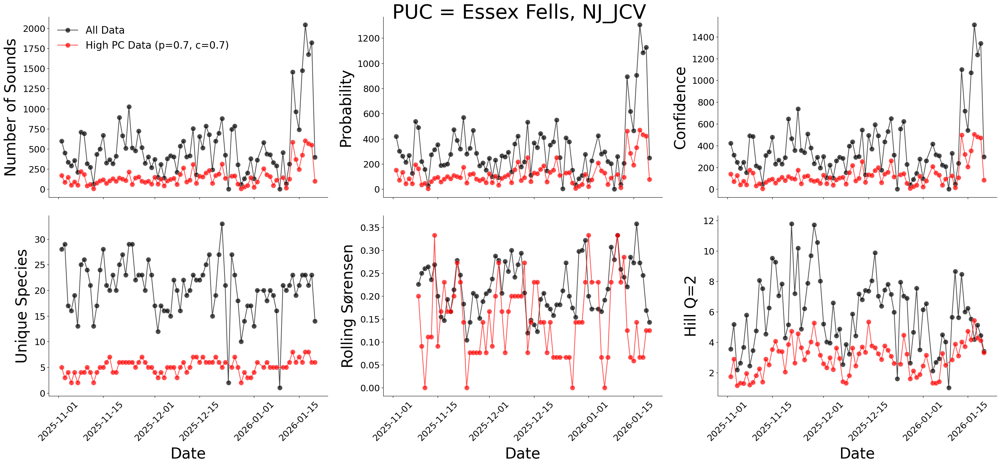

Saved: Auditory Data from Essex Fells PUC -> puc_audio_data_nj_jcv


'puc_audio_data_nj_jcv'

In [55]:
fig = plot_puc_data(station_name='Essex Fells', puc_name='PUC = Essex Fells, NJ_JCV')
save_plot_for_dashboard(
    fig, 
    'puc_audio_data_nj_jcv', 
    'Auditory Data from Essex Fells PUC',
    'Auditory data from Essex Fells PUC. Probability = historical likelihood of seeing a particular species in this location at this time of year. Confidence = how confident BirdNET AI is that this is the species identified. Unique Species = number of unique species identified in a given day.'
)

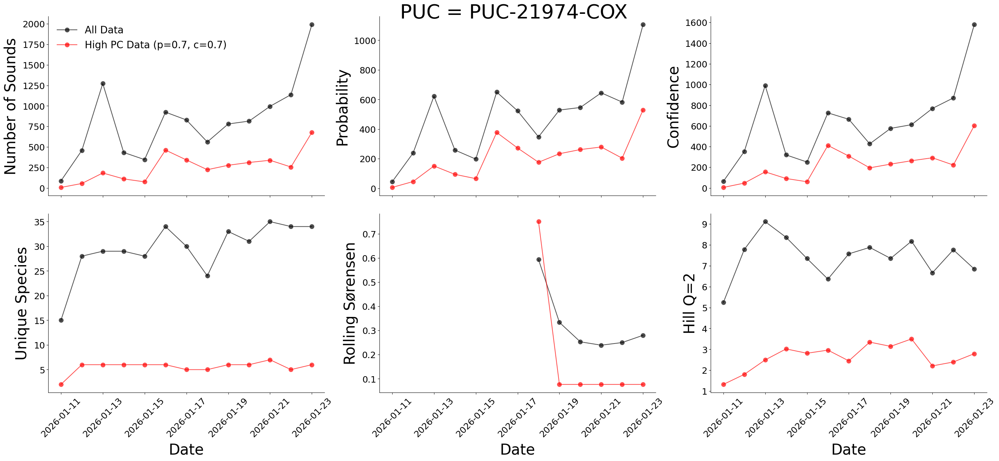

Saved: Auditory Data from Jacksonville PUC -> puc_audio_data_puc_21974_cox


'puc_audio_data_puc_21974_cox'

In [56]:
fig = plot_puc_data(station_name='Jacksonville', puc_name='PUC = PUC-21974-COX')
save_plot_for_dashboard(
    fig, 
    'puc_audio_data_puc_21974_cox', 
    'Auditory Data from Jacksonville PUC',
    'Auditory data from Jacksonville PUC. Probability = historical likelihood of seeing a particular species in this location at this time of year. Confidence = how confident BirdNET AI is that this is the species identified. Unique Species = number of unique species identified in a given day.'
)

# Add County PUC for Nested Analyses

In [57]:
# Read in all PUC data from surrounding county
county_puc_data = pd.read_parquet('../data/county_level_birdweather.parquet')

# Make sure data are in the right format
county_puc_data['date'] = pd.to_datetime(county_puc_data['timestamp'])
county_puc_data['date'] = county_puc_data['date'].astype(str)
county_puc_data['date'] = [val.split(' ')[0] for val in county_puc_data['date']]
county_puc_data['date'] = pd.to_datetime(county_puc_data['date'])
county_puc_data = county_puc_data[county_puc_data['date'] >= '2025-06-01']

# Remove today's data because incomplete
today = datetime.now().strftime('%Y-%m-%d')
county_puc_data = county_puc_data[county_puc_data['date'] != today]

# Create only high probability and confidence data
county_puc_data_high_pc = county_puc_data[(county_puc_data['confidence'] > conf_threshold) & (county_puc_data['probability'] > prob_threshold)].reset_index(drop=True)

In [58]:
# Get counts of sounds by date
count_by_date_all_county = county_puc_data.groupby(['date', 'county']).agg(
    count = ('id', 'count'), 
    probability = ('probability', 'sum'), 
    confidence = ('confidence', 'sum'),   
    unique_species = ('species_common', 'nunique')
).reset_index()

# Get counts of sounds by date
count_by_date_high_pc_county = county_puc_data_high_pc.groupby(['date', 'county']).agg(
    count = ('id', 'count'), 
    probability = ('probability', 'sum'), 
    confidence = ('confidence', 'sum'),   
    unique_species = ('species_common', 'nunique')
).reset_index()

# Calculate the metrics
rolling_sorensen_all_county = calculate_rolling_sorensen_dissimilarity_by_region_study_site(county_puc_data, col_to_process='county')
hill_q2_all_county = calculate_hill_q2_by_station(county_puc_data, col_to_process='county')

rolling_sorensen_high_pc_county = calculate_rolling_sorensen_dissimilarity_by_region_study_site(county_puc_data_high_pc, col_to_process='county')
hill_q2_high_pc_county = calculate_hill_q2_by_station(county_puc_data_high_pc, col_to_process='county')

# Merge with count_by_date
count_by_date_all_county = count_by_date_all_county.merge(
    rolling_sorensen_all_county[['date', 'county', 'rolling_sorensen']], 
    on=['date', 'county'], 
    how='left'
)
count_by_date_all_county = count_by_date_all_county.merge(
    hill_q2_all_county[['date', 'county', 'hill_q_2']], 
    on=['date', 'county'], 
    how='left'
)

# Merge with count_by_date
count_by_date_high_pc_county = count_by_date_high_pc_county.merge(
    rolling_sorensen_high_pc_county[['date', 'county', 'rolling_sorensen']], 
    on=['date', 'county'], 
    how='left'
)
count_by_date_high_pc_county = count_by_date_high_pc_county.merge(
    hill_q2_high_pc_county[['date', 'county', 'hill_q_2']], 
    on=['date', 'county'], 
    how='left'
)

In [59]:
# Add station relations for merging
count_by_date_all_county['station_name'] = count_by_date_all_county['county'].map({
    'essex_nj': 'Essex Fells', 
    'duval_fl': 'Jacksonville', 
    'st_johns_fl': 'St. Johns',
})

# Merge study site with county
count_by_date_merge = count_by_date_all.merge(
    count_by_date_all_county,
    on=['date', 'station_name'],
    how='right', 
    suffixes=('_study_site', '_county')
)

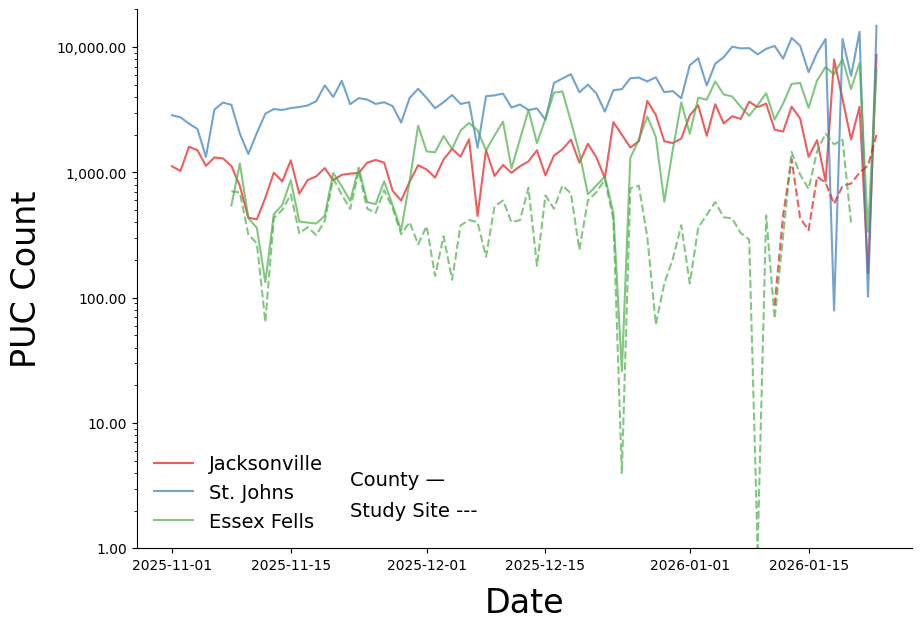

Saved: Auditory Data from Study Site vs County -> puc_audio_data_puc_site_to_county


'puc_audio_data_puc_site_to_county'

In [ ]:
fig, ax = plt.subplots(figsize=(10, 7))
sns.lineplot(
    x='date', y='count_county', 
    data=count_by_date_merge[count_by_date_merge['date'] >= '2025-11-01'], 
    hue='station_name', palette='Set1', alpha=0.7, 
    # markers=True, markersize=6, marker='o', markeredgewidth=0.5,
)
sns.lineplot(
    x='date', y='count_study_site', 
    data=count_by_date_merge[count_by_date_merge['date'] >= '2025-11-01'], 
    hue='station_name', palette='Set1', alpha=0.7, 
    linestyle='--', legend=False, 
    # markers=True, markersize=6, marker='o', markeredgewidth=0.5,
)
plt.text(x=datetime(2025, 11, 22), y=2.0, s='Study Site ---', fontsize=14, ha='left', va='center')
plt.text(x=datetime(2025, 11, 22), y=3.5, s='County —', fontsize=14, ha='left', va='center')

ax.set_xlabel('Date', fontsize=24, labelpad=10)
ax.set_ylabel('PUC Count', fontsize=24, labelpad=10)
plt.yscale('log')
plt.ylim(1, 20_000)
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, p: f'{x:,.2f}'))
sns.despine(top=True, right=True, ax=ax)
ax.legend(loc='lower left', fontsize=14, frameon=False)
plt.show()

save_plot_for_dashboard(
    fig, 
    'puc_audio_data_puc_site_to_county', 
    'Auditory Data from Study Site vs County',
    'Auditory data from PUCs at each study site (---) vs. PUC data from surrounding county (—)'
)